<a href="https://colab.research.google.com/github/anasshamoon12002/data-mining-2023-24/blob/main/Data%20Preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Mining Project, a.y. 2023-2024
## Salvatore Correnti, Jonathan Ato Markin, Anas Shamoon
## Data Preparation Notebook
**NOTE**: We use sampling-based filling of null values.


# Preliminary
These cells are for running the notebook with `Google Colab` using a `Google Drive` storage for the project repository. They can be skipped if data is available locally.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd "drive/MyDrive/Colab Notebooks/data-mining-2023-24"

/content/drive/MyDrive/Colab Notebooks/data-mining-2023-24


# Data Preparation

### Preliminary

In [3]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
import missingno as msno
import plotly.express as px

In [4]:
# Read Data Understanding dataframe (we already performed some preprocessing on it)
df_incidents = pd.read_csv('data/df_incidents_data_understanding.csv')

In [5]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175718 entries, 0 to 175717
Data columns (total 29 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   date                       175718 non-null  object 
 1   state                      175718 non-null  object 
 2   city_or_county             175718 non-null  object 
 3   address                    163366 non-null  object 
 4   latitude                   169449 non-null  float64
 5   longitude                  169449 non-null  float64
 6   congressional_district     166248 non-null  float64
 7   min_age_participants       128863 non-null  float64
 8   avg_age_participants       128862 non-null  float64
 9   max_age_participants       128862 non-null  float64
 10  n_participants_child       135152 non-null  float64
 11  n_participants_teen        135152 non-null  float64
 12  n_participants_adult       135152 non-null  float64
 13  n_males                    13

#### A quick look at `city_or_county`

In [6]:
df_incidents['city_or_county'].value_counts()

Chicago            7788
Baltimore          2993
Philadelphia       2297
Washington         2228
Milwaukee          2145
                   ... 
Red River             1
Grand Gorge           1
Jean                  1
Boulder County        1
Somerset County       1
Name: city_or_county, Length: 11494, dtype: int64

As we can see, there are $11494$ distinct values for `city_or_county`. We now count how many of them represent counties rather than cities:

In [7]:
len(set(df_incidents['city_or_county'].apply(lambda x: x if 'County' in x else None)))

563

We now group by `city_or_county`, `latitude` and `longitude`:

In [8]:
df = df_incidents[df_incidents['city_or_county'] == 'Milwaukee'].groupby(['city_or_county', 'latitude', 'longitude']).size().reset_index(name='Count')

In [9]:
df

,city_or_county,latitude,longitude,Count
0,Milwaukee,42.5566,-88.8737,1
1,Milwaukee,42.9034,-87.8626,1
2,Milwaukee,42.9053,-87.8673,1
3,Milwaukee,42.9078,-87.8570,1
4,Milwaukee,42.9100,-87.8733,1
...,...,...,...,...
1742,Milwaukee,43.1833,-88.0287,1
1743,Milwaukee,43.1844,-88.0029,1
1744,Milwaukee,43.1846,-88.0303,1
1745,Milwaukee,43.1860,-88.0029,1


In [10]:
latitudes = df_incidents[df_incidents['city_or_county'] == 'Milwaukee']['latitude']
print(latitudes.min(), latitudes.max())

42.5566 43.1864


In [11]:
longitudes = df_incidents[df_incidents['city_or_county'] == 'Milwaukee']['longitude']
print(longitudes.min(), longitudes.max())

-89.4897 -87.857


In [12]:
df_incidents[df_incidents['city_or_county'] == 'Milwaukee']['state'].value_counts()

Wisconsin    2145
Name: state, dtype: int64

From this example, we can conclude that there is *only* one city named `Milwaukee` in the whole dataset (i.e. no different cities with same name).

## Remove Useless Columns
We can remove `date`, `city_or_county`, `address`, `notes`, `incident_characteristics1`, `incident_characteristics2` and `is_valid_state`.

In [13]:
# Discarding useless columns
useless_columns = [
    'date', 'address', 'notes', 'incident_characteristics1',
    'incident_characteristics2', 'is_valid_state',
]
df_incidents.drop(columns=useless_columns, inplace=True)

# Handle Missing Values in  Incidents Data

## Utils
These utils are made for replacing `NaN` values in columns. In particular:
*  `regression` mode builds a `LinearRegression` model based on `input_columns` for predicting missing values for `column`;
* `sampling` mode samples missing values for `column` from the empirical distribution induced by the non-null ones.

In [14]:
def replace_from_non_null_distribution(df, column, mode='regression', input_columns=None):
  """
  Replaces null values in `column` without constraints given by other columns.
  """
  if mode == 'regression':
    return _replace_from_non_null_regression(df, column, input_columns)
  else:
    return _replace_from_non_null_sampling(df, column)

def _replace_from_non_null_regression(df, column, input_columns):
  X = df[input_columns].dropna()  # Features (predictors) without missing values
  y = df[column].dropna()  # Target variable without missing values
  X = X[df[column].notnull()]
  # Create a regression model and fit it using available data
  regression_model = LinearRegression()
  regression_model.fit(X, y)
  # Predict missing values in column C using the regression model
  X_missing = df[input_columns][df[column].isnull()]  # Features for missing values
  predicted_values = regression_model.predict(X_missing)
  # Fill missing values in column C with the predicted values
  df.loc[df[column].isnull(), column] = predicted_values
  return df

def _replace_from_non_null_sampling(df, column):
  # Extract non-null values from column 'A'
  non_null_values = df[column][df[column].notnull()]
  # Sample values from the distribution of non-null values
  sampled_values = non_null_values.sample(n=df[column].isnull().sum(), replace=True)
  # Replace null values with sampled values
  df.loc[df[column].isnull(), column] = sampled_values.values
  return df

In [15]:
def replace_from_non_null_distribution_with_min_threshold(df, columnA, columnB, mode='regression', input_columns=None):
  """
  Replaces null values in `columnA` with the constraint of item[columnA] >= item[columnB] for each item. In particular,
  if the predicted or sampled value is < item[columnB], it sets item[columnA] <- item[columnB].
  """
  if mode == 'regression':
    replacement_values = _replace_from_non_null_with_min_regression(df, columnA, columnB, input_columns)
  else:
    replacement_values = _replace_from_non_null_with_min_sampling(df, columnA, columnB)
  for (idx, val), value in zip(df.loc[df[columnA].isnull(), columnA].items(), replacement_values):
    min_allowed_A = df.at[idx, columnB]  # Minimum allowed value for columnA in this row
    df.at[idx, columnA] = max(min_allowed_A, value)
  return df

def _replace_from_non_null_with_min_regression(df, columnA, columnB, input_columns):
  X = df[input_columns].dropna()  # Features (predictors) without missing values
  y = df[columnA].dropna()  # Target variable without missing values
  X = X[df[columnA].notnull()]
  # Create a regression model and fit it using available data
  regression_model = LinearRegression()
  regression_model.fit(X, y)
  # Predict missing values in column C using the regression model
  X_missing = df[input_columns][df[columnA].isnull()]  # Features for missing values
  predicted_values = regression_model.predict(X_missing)
  return predicted_values

def _replace_from_non_null_with_min_sampling(df, columnA, columnB):
  non_null_values = df[columnA][df[columnA].notnull()]
  sampled_values = non_null_values.sample(n=df[columnA].isnull().sum(), replace=True)
  return sampled_values

In [16]:
def replace_from_non_null_distribution_with_max_threshold(df, columnA, columnB, columns, mode='regression', input_columns=None):
  """
  Replaces null values in `columnA` with the constraints of item[columnA] <= item[columnB] - sum([item[column] for column in columns])
  for each item. In particular, if S := sum([item[column] for column in columns]) and the predicted or sampled value is < item[columnB] - S,
  it sets item[columnA] <- item[columnB] - S.
  """
  if mode == 'regression':
    replacement_values = _replace_from_non_null_with_max_regression(df, columnA, columnB, input_columns)
  else:
    replacement_values = _replace_from_non_null_with_max_sampling(df, columnA, columnB, columns)
  for (idx, val), value in zip(df.loc[df[columnA].isnull(), columnA].items(), replacement_values):
    max_allowed_A = df.at[idx, columnB]  # Minimum allowed value for columnA in this row
    for column in columns:
      max_allowed_A -= df.at[idx, column]
    df.at[idx, columnA] = min(value, max(max_allowed_A, 0))
  return df

def _replace_from_non_null_with_max_regression(df, columnA, columnB, input_columns):
  X = df[input_columns].dropna()  # Features (predictors) without missing values
  y = df[columnA].dropna()  # Target variable without missing values
  X = X[df[columnA].notnull()]
  # Create a regression model and fit it using available data
  regression_model = LinearRegression()
  regression_model.fit(X, y)
  # Predict missing values in column C using the regression model
  X_missing = df[input_columns][df[columnA].isnull()]  # Features for missing values
  predicted_values = regression_model.predict(X_missing)
  return predicted_values

def _replace_from_non_null_with_max_sampling(df, columnA, columnB, columns):
  non_null_values = df[columnA][df[columnA].notnull()]
  sampled_values = non_null_values.sample(n=df[columnA].isnull().sum(), replace=True)
  return sampled_values

In [17]:
# Discard the records with nulls in location information
location_columns = ['latitude', 'longitude', 'congressional_district']
df_incidents = df_incidents.dropna(subset=location_columns)

In [18]:
# Define replacement mode for null entries
REPLACEMENT_MODE = 'sampling'  #'regression'

In [19]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 166240 entries, 0 to 175717
Data columns (total 23 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   state                   166240 non-null  object 
 1   city_or_county          166240 non-null  object 
 2   latitude                166240 non-null  float64
 3   longitude               166240 non-null  float64
 4   congressional_district  166240 non-null  float64
 5   min_age_participants    121637 non-null  float64
 6   avg_age_participants    121636 non-null  float64
 7   max_age_participants    121636 non-null  float64
 8   n_participants_child    127614 non-null  float64
 9   n_participants_teen     127614 non-null  float64
 10  n_participants_adult    127614 non-null  float64
 11  n_males                 131870 non-null  float64
 12  n_females               131870 non-null  float64
 13  n_killed                166240 non-null  int64  
 14  n_injured           

In [20]:
NEVER_NULL_COLUMNS = ['latitude', 'longitude', 'n_killed', 'n_injured', 'n_participants', 'year', 'month', 'day', 'weekday']

<Axes: ylabel='Frequency'>

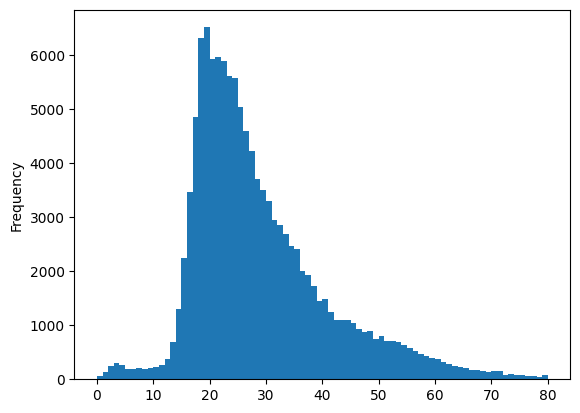

In [21]:
%matplotlib inline
df_incidents['min_age_participants'].plot(kind='hist', bins=80)

In [22]:
# Replace null values in `min_age_participants` with sampled values
df_incidents = replace_from_non_null_distribution(df_incidents, 'min_age_participants', mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

<Axes: ylabel='Frequency'>

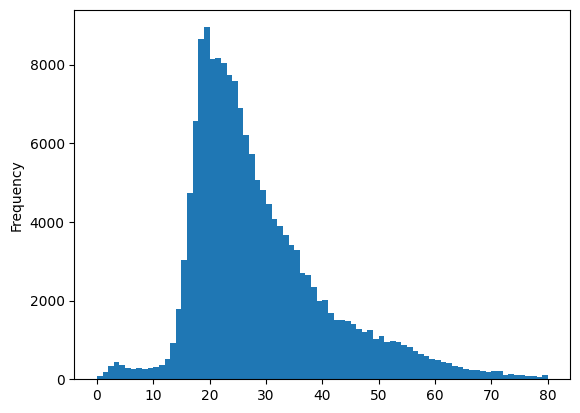

In [23]:
%matplotlib inline
df_incidents['min_age_participants'].plot(kind='hist', bins=80)

In [24]:
df_incidents['min_age_participants'].isnull().sum()

0

In [25]:
# Replace null values in `avg_age_participants` with the constraint item[avg_age_participants] >= item[min_age_participants] and sampling mode
df_incidents = replace_from_non_null_distribution_with_min_threshold(df_incidents, 'avg_age_participants', 'min_age_participants', mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [26]:
df_incidents['avg_age_participants'].isnull().sum()

0

In [27]:
condition = df_incidents['min_age_participants'] > df_incidents['avg_age_participants']
len(df_incidents[condition])

0

In [28]:
# Replace null values in `max_age_participants` with the constraint item[max_age_participants] >= item[avg_age_participants] and sampling mode
df_incidents = replace_from_non_null_distribution_with_min_threshold(df_incidents, 'max_age_participants', 'avg_age_participants', mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [29]:
condition = df_incidents['avg_age_participants'] > df_incidents['max_age_participants']
len(df_incidents[condition])

0

In [30]:
# Print the columns with nulls and their count and percentage
missing_values = df_incidents.isnull().sum()
print(f"Missing values:\n{missing_values}")

Missing values:
state                         0
city_or_county                0
latitude                      0
longitude                     0
congressional_district        0
min_age_participants          0
avg_age_participants          0
max_age_participants          0
n_participants_child      38626
n_participants_teen       38626
n_participants_adult      38626
n_males                   34370
n_females                 34370
n_killed                      0
n_injured                     0
n_arrested                26079
n_unharmed                26079
n_participants                0
datetime                      0
year                          0
month                         0
day                           0
weekday                       0
dtype: int64


In [31]:
# Replace null values in `n_participants_child` with the constraint item[n_participants_child] <= item[n_participants] and sampling mode
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_child', 'n_participants', columns=[], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [32]:
condition = df_incidents['n_participants_child'] > df_incidents['n_participants']
len(df_incidents[condition])

0

In [33]:
# Replace null values in `n_participants_teen` with the constraint item[n_participants_teen] <= item[n_participants] - item[n_participants_child] and sampling mode
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_teen', 'n_participants', columns=['n_participants_child'], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [34]:
# Replace null values in `n_participants_adult` with the constraint item[n_participants_adult] <= item[n_participants] - item[n_participants_child] - item[n_participants_teen] and sampling mode
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_participants_adult', 'n_participants', columns=['n_participants_child', 'n_participants_teen'], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [35]:
condition = df_incidents['n_participants_teen'] + df_incidents['n_participants_child'] + df_incidents['n_participants_adult'] > df_incidents['n_participants']
len(df_incidents[condition])

0

In [36]:
len(df_incidents)

166240

In [37]:
# Print the columns with nulls and their count and percentage
missing_values = df_incidents.isnull().sum()
print(f"Missing values:\n{missing_values}")

Missing values:
state                         0
city_or_county                0
latitude                      0
longitude                     0
congressional_district        0
min_age_participants          0
avg_age_participants          0
max_age_participants          0
n_participants_child          0
n_participants_teen           0
n_participants_adult          0
n_males                   34370
n_females                 34370
n_killed                      0
n_injured                     0
n_arrested                26079
n_unharmed                26079
n_participants                0
datetime                      0
year                          0
month                         0
day                           0
weekday                       0
dtype: int64


In [38]:
# Replace null values in `n_males` with the constraint item[n_males] <= item[n_participants] and sampling mode
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_males', 'n_participants', columns=[], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [39]:
# We verify that there are no records for which item[n_males] + item[n_females] != item[n_participants] and item[n_females] != null
condition = df_incidents['n_females'].isnull() | (df_incidents['n_males'] + df_incidents['n_females'] == df_incidents['n_participants'])
len(df_incidents[~condition])

0

In [40]:
# We can then replace nulls in n_females simply by redefining item[n_females] := item[n_participants] - item[n_males] for each item
df_incidents['n_females'] = df_incidents['n_participants'] - df_incidents['n_males']

In [41]:
len(df_incidents[df_incidents['n_participants'] == 0])

23605

In [42]:
# We use max(item[n_participants], 1) to make sure to not get NaN if item[n_participants] == 0 (and instead we get 0)
df_incidents['males_ratio'] = df_incidents['n_males'] / df_incidents['n_participants'].apply(lambda x: max(x, 1))
df_incidents['females_ratio'] = df_incidents['n_females'] / df_incidents['n_participants'].apply(lambda x: max(x, 1))

In [43]:
df_incidents.isnull().sum()

state                         0
city_or_county                0
latitude                      0
longitude                     0
congressional_district        0
min_age_participants          0
avg_age_participants          0
max_age_participants          0
n_participants_child          0
n_participants_teen           0
n_participants_adult          0
n_males                       0
n_females                     0
n_killed                      0
n_injured                     0
n_arrested                26079
n_unharmed                26079
n_participants                0
datetime                      0
year                          0
month                         0
day                           0
weekday                       0
males_ratio                   0
females_ratio                 0
dtype: int64

In [44]:
# Similar check to the one before for n_males, n_females and n_participants
condition = df_incidents['n_unharmed'].isnull() | (df_incidents['n_injured'] + df_incidents['n_unharmed'] <= df_incidents['n_participants'])
len(df_incidents[~condition])

16

In [45]:
# Fill nulls with sampling and max threshold
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_arrested', 'n_participants', columns=[], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)
df_incidents = replace_from_non_null_distribution_with_max_threshold(df_incidents, 'n_unharmed', 'n_participants', columns=['n_injured'], mode=REPLACEMENT_MODE, input_columns=NEVER_NULL_COLUMNS)

In [46]:
condition = df_incidents['n_injured'] + df_incidents['n_unharmed'] <= df_incidents['n_participants']
len(df_incidents[~condition])

16

In [47]:
# Remove items for which item['n_injured'] +item['n_unharmed'] > item['n_participants']
df_incidents = df_incidents[condition]
len(df_incidents)

166224

In [48]:
# Cast congressional_district to int
df_incidents['congressional_district'] = df_incidents['congressional_district'].astype(int)

<ipython-input-48-9b903c00a9d4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_incidents['congressional_district'] = df_incidents['congressional_district'].astype(int)


In [49]:
# Create a composite key for state and congressional_district. Use lowercase for state
df_incidents['state_congressional_district'] = df_incidents['state'].str.lower() + '_' + df_incidents['congressional_district'].astype(str)
# Remove spaces
df_incidents['state_congressional_district'] = df_incidents['state_congressional_district'].str.replace(' ', '')

#Print the first few rows of the dataframe
df_incidents.head()

,state,city_or_county,latitude,longitude,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,...,n_unharmed,n_participants,datetime,year,month,day,weekday,males_ratio,females_ratio,state_congressional_district
0,Indiana,Indianapolis,39.8322,-86.2492,7,19.0,19.0,19.0,0.0,0.0,...,0.0,1.0,2015-05-02,2015,5,2,5,1.0,0.0,indiana_7
1,Pennsylvania,Kane,41.6645,-78.7856,5,62.0,62.0,62.0,0.0,0.0,...,0.0,1.0,2017-04-03,2017,4,3,0,1.0,0.0,pennsylvania_5
2,Michigan,Detroit,42.4190,-83.0393,14,25.0,53.0,53.0,0.0,2.0,...,1.0,2.0,2016-11-05,2016,11,5,5,0.5,0.5,michigan_14
3,North Carolina,Wayne County,35.1847,-77.9527,13,65.0,65.0,65.0,0.0,0.0,...,0.0,1.0,2014-01-18,2014,1,18,5,1.0,0.0,northcarolina_13
4,Louisiana,Zachary,30.6069,-91.2270,6,20.0,26.0,30.0,0.0,0.0,...,0.0,5.0,2018-01-25,2018,1,25,3,1.0,0.0,louisiana_6


In [50]:
df_incidents.drop(columns=['month', 'day', 'weekday'], inplace=True)

## Removing Duplicates

In [51]:
print(len(df_incidents))
df_incidents = df_incidents.drop_duplicates()
print(len(df_incidents))

166224
166064


## Removing Outliers
The following utils allow to remove outliers based on InterQuartile Range (IQR) and Z-Score modes, in particular:
* `iqr_attribute_outliers_remove` uses IQR with whiskers (threshold);
* `z_score_attribute_outliers_remove` uses Z-Score with threshold, i.e. it removes all records whose column value is outside `threshold` standard deviations from the mean.

In [52]:
def iqr_attribute_outliers_remove(df, columns, threshold=1.5):
  """
  Outliers removal based on IQR method.
  """
  # Calculate the 25th and 75th percentiles (Q1 and Q3)
  Q1 = df[columns].quantile(0.25)
  Q3 = df[columns].quantile(0.75)
  # Calculate the IQR (Interquartile Range)
  IQR = Q3 - Q1
  # Define the lower and upper bounds for outliers
  lower_bound = Q1 - threshold * IQR
  upper_bound = Q3 + threshold * IQR
  print(f"{columns} has the following: Q1 = {Q1}, Q3 = {Q3}, IQR = {IQR}, Lower Bound = {lower_bound}, Upper Bound = {upper_bound}")
  # Identify outliers using IQR
  outliers = df[(df[columns] < lower_bound) | (df[columns] > upper_bound)]
  print(f"Identified {len(outliers)} outliers for columns {columns} with threshold = {threshold}")
  # Remove outliers from the DataFrame
  df_no_outliers = df[(df[columns] >= lower_bound) & (df[columns] <= upper_bound)]
  print(f"Original Dataframe has minimum {columns} = {df[columns].min()}, maximum {columns} = {df[columns].max()}")
  print(f"Cleaned Dataframe has minimum {columns} = {df_no_outliers[columns].min()}, maximum {columns} = {df_no_outliers[columns].max()}")
  return df_no_outliers

In [53]:
def z_score_attribute_outliers_remove(df, columns, threshold=3):
  """
  Outliers removal based on Z-Score method.
  """
  z_scores = np.abs((df[columns] - df[columns].mean()) / df[columns].std())
  outliers = df[z_scores > threshold]
  print(f"Identified {len(outliers)} outliers for columns {columns} with threshold = {threshold}")
  df_no_outliers = df[z_scores <= threshold]
  print(f"Original Dataframe has minimum {columns} = {df[columns].min()}, maximum {columns} = {df[columns].max()}")
  print(f"Cleaned Dataframe has minimum {columns} = {df_no_outliers[columns].min()}, maximum {columns} = {df_no_outliers[columns].max()}")
  return df_no_outliers

In [54]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 166064 entries, 0 to 175717
Data columns (total 23 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         166064 non-null  object 
 1   city_or_county                166064 non-null  object 
 2   latitude                      166064 non-null  float64
 3   longitude                     166064 non-null  float64
 4   congressional_district        166064 non-null  int64  
 5   min_age_participants          166064 non-null  float64
 6   avg_age_participants          166064 non-null  float64
 7   max_age_participants          166064 non-null  float64
 8   n_participants_child          166064 non-null  float64
 9   n_participants_teen           166064 non-null  float64
 10  n_participants_adult          166064 non-null  float64
 11  n_males                       166064 non-null  float64
 12  n_females                     166064 non-nul

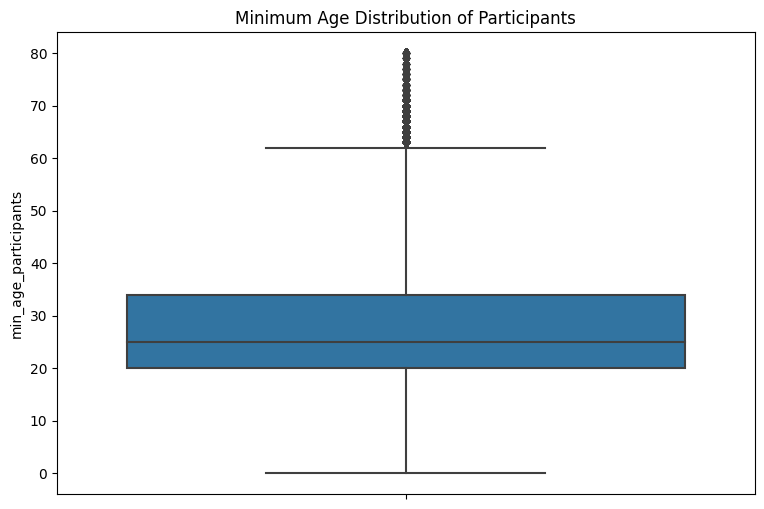

In [55]:
# Box plot for age distributions by state:
# This can give an idea about the age distribution of participants involved in incidents for each state.

plt.figure(figsize=(9,6))
sn.boxplot(data=df_incidents, y='min_age_participants', whis=2.0)
plt.xticks(rotation=90)
plt.title('Minimum Age Distribution of Participants')
plt.show()

In [56]:
# Temporarily save an intermediate backup of the dataframe up to so far.
df_incidents.to_csv('data/df_incidents_data_preparation_temp.csv', index=False)

We have prioritized to use IQR method to remove outliers and to use Z-Score when IQR would have removed a significant portion of the dataset. Below are the results with both methods after a few preliminary trials with both.

In [57]:
# Remove outliers based on IQR method and whiskers = 2.0
outliers_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']
df_incidents_no_outliers = df_incidents.copy()

print(f"{len(df_incidents_no_outliers)}\n")
for column in outliers_columns:
  df_incidents_no_outliers = iqr_attribute_outliers_remove(df_incidents_no_outliers, column, threshold=2.0)
  print()
print(f"{len(df_incidents_no_outliers)}\n")

166064

min_age_participants has the following: Q1 = 20.0, Q3 = 34.0, IQR = 14.0, Lower Bound = -8.0, Upper Bound = 62.0
Identified 3044 outliers for columns min_age_participants with threshold = 2.0
Original Dataframe has minimum min_age_participants = 0.0, maximum min_age_participants = 80.0
Cleaned Dataframe has minimum min_age_participants = 0.0, maximum min_age_participants = 62.0

avg_age_participants has the following: Q1 = 22.0, Q3 = 37.0, IQR = 15.0, Lower Bound = -8.0, Upper Bound = 67.0
Identified 466 outliers for columns avg_age_participants with threshold = 2.0
Original Dataframe has minimum avg_age_participants = 0.0, maximum avg_age_participants = 80.0
Cleaned Dataframe has minimum avg_age_participants = 0.0, maximum avg_age_participants = 67.0

max_age_participants has the following: Q1 = 23.0, Q3 = 41.0, IQR = 18.0, Lower Bound = -13.0, Upper Bound = 77.0
Identified 205 outliers for columns max_age_participants with threshold = 2.0
Original Dataframe has minimum max_ag

In [58]:
# We see that only a few items have n_participants_child > 0.
len(df_incidents_no_outliers[df_incidents_no_outliers['n_participants_child'] > 0])

2938

In [59]:
# We see also that a significant amount of items have n_participants_teen between 0 and 1.
len(df_incidents_no_outliers[(df_incidents_no_outliers['n_participants_teen'] > 0) & (df_incidents_no_outliers['n_participants_teen'] <= 1)])

12664

In [60]:
len(df_incidents_no_outliers[(df_incidents_no_outliers['n_participants_teen'] > 1)])

3147

We use also the above observations to use Z-Score for n_participants_teen.

In [61]:
# Z-Score with a threshold of 2
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_participants_teen', threshold=2)

Identified 15811 outliers for columns n_participants_teen with threshold = 2
Original Dataframe has minimum n_participants_teen = 0.0, maximum n_participants_teen = 7.0
Cleaned Dataframe has minimum n_participants_teen = 0.0, maximum n_participants_teen = 0.0


In [62]:
# Z-Score with a threshold of 3
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_participants_teen', threshold=3)

Identified 3147 outliers for columns n_participants_teen with threshold = 3
Original Dataframe has minimum n_participants_teen = 0.0, maximum n_participants_teen = 7.0
Cleaned Dataframe has minimum n_participants_teen = 0.0, maximum n_participants_teen = 1.0


In [63]:
df_incidents_no_outliers = df_incidents_zscore
len(df_incidents_no_outliers)

159202

In [64]:
# Remove outliers based on IQR method
outliers_columns = ['n_participants_child', 'n_participants_adult', 'n_participants']
print(f"{len(df_incidents_no_outliers)}\n")
for column in outliers_columns:
  df_incidents_no_outliers = iqr_attribute_outliers_remove(df_incidents_no_outliers, column, threshold=2)
  print()
print(f"{len(df_incidents_no_outliers)}\n")

159202

n_participants_child has the following: Q1 = 0.0, Q3 = 0.0, IQR = 0.0, Lower Bound = 0.0, Upper Bound = 0.0
Identified 2886 outliers for columns n_participants_child with threshold = 2
Original Dataframe has minimum n_participants_child = 0.0, maximum n_participants_child = 5.0
Cleaned Dataframe has minimum n_participants_child = 0.0, maximum n_participants_child = 0.0

n_participants_adult has the following: Q1 = 1.0, Q3 = 2.0, IQR = 1.0, Lower Bound = -1.0, Upper Bound = 4.0
Identified 1766 outliers for columns n_participants_adult with threshold = 2
Original Dataframe has minimum n_participants_adult = 0.0, maximum n_participants_adult = 10.0
Cleaned Dataframe has minimum n_participants_adult = 0.0, maximum n_participants_adult = 4.0

n_participants has the following: Q1 = 1.0, Q3 = 2.0, IQR = 1.0, Lower Bound = -1.0, Upper Bound = 4.0
Identified 444 outliers for columns n_participants with threshold = 2
Original Dataframe has minimum n_participants = 0.0, maximum n_particip

As we can see, after Outlier Removal the feature `n_participants_child` has become irrelevant, since all records have value $0$, hence we can remove it.

In [65]:
df_incidents_no_outliers.drop(columns=['n_participants_child'], inplace=True)

In [66]:
# Remove outliers based on IQR method
outliers_columns = ['n_males', 'n_injured', 'n_arrested']
print(f"{len(df_incidents_no_outliers)}\n")
for column in outliers_columns:
  df_incidents_no_outliers = iqr_attribute_outliers_remove(df_incidents_no_outliers, column, threshold=2)
  print()
print(f"{len(df_incidents_no_outliers)}\n")

154106

n_males has the following: Q1 = 1.0, Q3 = 2.0, IQR = 1.0, Lower Bound = -1.0, Upper Bound = 4.0
Identified 0 outliers for columns n_males with threshold = 2
Original Dataframe has minimum n_males = 0.0, maximum n_males = 4.0
Cleaned Dataframe has minimum n_males = 0.0, maximum n_males = 4.0

n_injured has the following: Q1 = 0.0, Q3 = 1.0, IQR = 1.0, Lower Bound = -2.0, Upper Bound = 3.0
Identified 197 outliers for columns n_injured with threshold = 2
Original Dataframe has minimum n_injured = 0, maximum n_injured = 4
Cleaned Dataframe has minimum n_injured = 0, maximum n_injured = 3

n_arrested has the following: Q1 = 0.0, Q3 = 1.0, IQR = 1.0, Lower Bound = -2.0, Upper Bound = 3.0
Identified 440 outliers for columns n_arrested with threshold = 2
Original Dataframe has minimum n_arrested = 0.0, maximum n_arrested = 4.0
Cleaned Dataframe has minimum n_arrested = 0.0, maximum n_arrested = 3.0

153469



We determined that `n_killed` needs to be handled with Z-Score.

In [67]:
# Z-Score for n_killed with threshold = 2
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_killed', threshold=2)

Identified 3205 outliers for columns n_killed with threshold = 2
Original Dataframe has minimum n_killed = 0, maximum n_killed = 4
Cleaned Dataframe has minimum n_killed = 0, maximum n_killed = 1


In [68]:
# With threshold = 3
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_killed', threshold=3)

Identified 3205 outliers for columns n_killed with threshold = 3
Original Dataframe has minimum n_killed = 0, maximum n_killed = 4
Cleaned Dataframe has minimum n_killed = 0, maximum n_killed = 1


In [69]:
# We keep the result with threshold = 3
df_incidents_no_outliers = df_incidents_zscore.copy()
len(df_incidents_no_outliers)

150264

In [70]:
len(df_incidents_no_outliers[(df_incidents_no_outliers['n_females'] > 0) & (df_incidents_no_outliers['n_females'] <= 1)])

18968

In [71]:
len(df_incidents_no_outliers[(df_incidents_no_outliers['n_females'] > 1)])

1987

In [72]:
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_females', threshold=2)

Identified 20955 outliers for columns n_females with threshold = 2
Original Dataframe has minimum n_females = 0.0, maximum n_females = 4.0
Cleaned Dataframe has minimum n_females = 0.0, maximum n_females = 0.0


In [73]:
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_females', threshold=3)

Identified 1987 outliers for columns n_females with threshold = 3
Original Dataframe has minimum n_females = 0.0, maximum n_females = 4.0
Cleaned Dataframe has minimum n_females = 0.0, maximum n_females = 1.0


In [74]:
# We keep the result with threshold = 3
df_incidents_no_outliers = df_incidents_zscore.copy()
len(df_incidents_no_outliers)

148277

In [75]:
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_unharmed', threshold=2)

Identified 7859 outliers for columns n_unharmed with threshold = 2
Original Dataframe has minimum n_unharmed = 0.0, maximum n_unharmed = 4.0
Cleaned Dataframe has minimum n_unharmed = 0.0, maximum n_unharmed = 1.0


In [76]:
df_incidents_zscore = z_score_attribute_outliers_remove(df_incidents_no_outliers, 'n_unharmed', threshold=3)

Identified 2158 outliers for columns n_unharmed with threshold = 3
Original Dataframe has minimum n_unharmed = 0.0, maximum n_unharmed = 4.0
Cleaned Dataframe has minimum n_unharmed = 0.0, maximum n_unharmed = 2.0


In [77]:
# We keep the result with threshold = 3
df_incidents_no_outliers = df_incidents_zscore.copy()
len(df_incidents_no_outliers)

146119

In [78]:
df_incidents_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 146119 entries, 0 to 175717
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         146119 non-null  object 
 1   city_or_county                146119 non-null  object 
 2   latitude                      146119 non-null  float64
 3   longitude                     146119 non-null  float64
 4   congressional_district        146119 non-null  int64  
 5   min_age_participants          146119 non-null  float64
 6   avg_age_participants          146119 non-null  float64
 7   max_age_participants          146119 non-null  float64
 8   n_participants_teen           146119 non-null  float64
 9   n_participants_adult          146119 non-null  float64
 10  n_males                       146119 non-null  float64
 11  n_females                     146119 non-null  float64
 12  n_killed                      146119 non-nul

In [79]:
# Remove outliers also for latitude and longitude
outliers_columns = ['latitude', 'longitude']
print(f"{len(df_incidents_no_outliers)}\n")
for column in outliers_columns:
  df_incidents_no_outliers = iqr_attribute_outliers_remove(df_incidents_no_outliers, column, threshold=3)
  print()
print(f"{len(df_incidents_no_outliers)}\n")

146119

latitude has the following: Q1 = 34.13745, Q3 = 41.6243, IQR = 7.486849999999997, Lower Bound = 11.67690000000001, Upper Bound = 64.08484999999999
Identified 220 outliers for columns latitude with threshold = 3
Original Dataframe has minimum latitude = 19.1114, maximum latitude = 71.3368
Cleaned Dataframe has minimum latitude = 19.1114, maximum latitude = 64.0558

longitude has the following: Q1 = -93.35875, Q3 = -79.3065, IQR = 14.05225, Lower Bound = -135.5155, Upper Bound = -37.14975
Identified 751 outliers for columns longitude with threshold = 3
Original Dataframe has minimum longitude = -171.429, maximum longitude = -67.275
Cleaned Dataframe has minimum longitude = -135.445, maximum longitude = -67.275

145148



In [80]:
# Save the state of the dataframe so far
df_incidents_no_outliers.to_csv('data/df_incidents_data_preparation_base_outliers_removal.csv', index=False)

We now check if we can furtherly remove other columns by considering how the correlation matrix has changed:

In [81]:
numerical_fields = [
    'min_age_participants', 'avg_age_participants', 'max_age_participants',
    'n_participants_teen', 'n_participants_adult', 'n_participants',
    'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed',
]

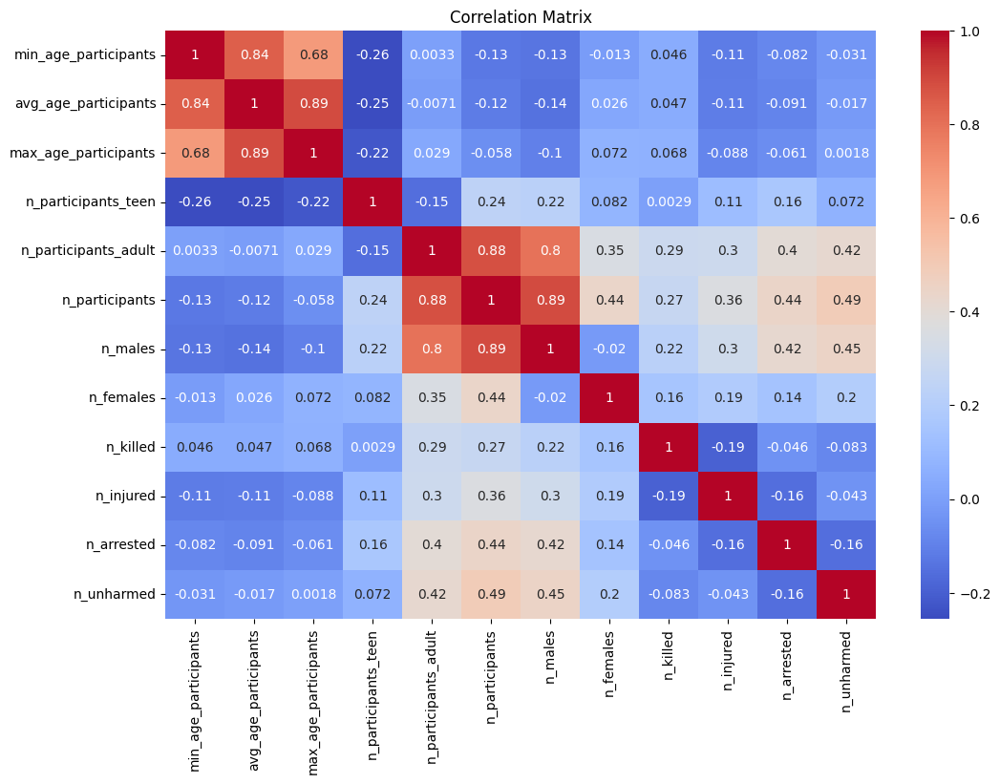

In [82]:
correlation_matrix = df_incidents[numerical_fields].corr()
plt.figure(figsize=(12,8))
sn.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

As we can see, `avg_age_participants` and `n_participants` are highly correlated (hence they "summarize well") the neighbouring columns, i.e. [`max_age_participants`, `min_age_participants`] and [`n_participants_adult`, `n_males`] respectively, hence we can discard those $4$ columns.

In [83]:
df_incidents_no_outliers.drop(columns=['min_age_participants', 'max_age_participants', 'n_participants_adult', 'n_males'], inplace=True)

In [84]:
df_incidents_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145148 entries, 0 to 175717
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         145148 non-null  object 
 1   city_or_county                145148 non-null  object 
 2   latitude                      145148 non-null  float64
 3   longitude                     145148 non-null  float64
 4   congressional_district        145148 non-null  int64  
 5   avg_age_participants          145148 non-null  float64
 6   n_participants_teen           145148 non-null  float64
 7   n_females                     145148 non-null  float64
 8   n_killed                      145148 non-null  int64  
 9   n_injured                     145148 non-null  int64  
 10  n_arrested                    145148 non-null  float64
 11  n_unharmed                    145148 non-null  float64
 12  n_participants                145148 non-nul

## Saving Final Dataframe before merging

In [85]:
df_incidents.to_csv('data/df_incidents_data_preparation_state_congressional_ids.csv', index=False)

# Ingest The Poverty Dataset and Handle it

In [86]:
df_poverty = pd.read_csv('data/povertyByStateYear.csv')

In [87]:
df_poverty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884 entries, 0 to 883
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   state              884 non-null    object 
 1   year               884 non-null    int64  
 2   povertyPercentage  832 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 20.8+ KB


From the information about the dataframe, we can observe that `povertyPercentage` is the only field with null values.

In [88]:
df_poverty.describe()

,year,povertyPercentage
count,884.000000,832.000000
mean,2011.998869,12.535817
std,4.902330,3.205233
min,2004.000000,5.400000
25%,2008.000000,10.200000
50%,2012.000000,12.000000
75%,2016.000000,14.700000
max,2020.000000,21.800000


In [89]:
# Check for missing values
df_poverty.isnull().sum()

state                 0
year                  0
povertyPercentage    52
dtype: int64

<Axes: >

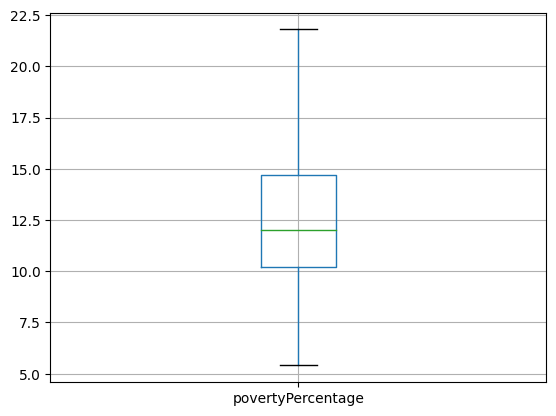

In [90]:
# Check for outliers on the poverty rate
df_poverty.boxplot(column=['povertyPercentage'], whis=2.0)

In [91]:
valid_state_names = [
    'Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','Florida','Georgia','Hawaii',
    'Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts','Michigan',
    'Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
    'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
    'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming',
    'District of Columbia'
]

In [92]:
# Check for invalid state names
invalid_state_names = set(df_poverty['state'].unique()).difference(set(valid_state_names))
print(invalid_state_names)

# Count number of rows with invalid state names
df_poverty.loc[df_poverty['state'].isin(invalid_state_names)].count()

{'United States'}


state                17
year                 17
povertyPercentage    16
dtype: int64

In [93]:
# Drop rows with invalid state names
df_poverty = df_poverty.loc[df_poverty['state'].isin(valid_state_names)]

In [94]:
len(df_poverty)

867

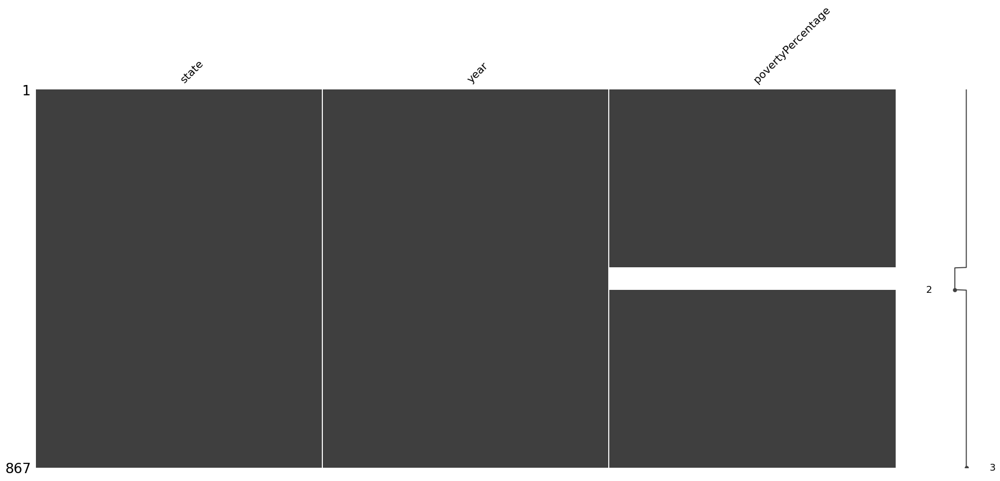

<Figure size 300x200 with 0 Axes>

In [95]:
# Use the nullity matrix to get a quick visual summary of the data completeness
msno.matrix(df_poverty)
plt.figure(figsize =(3,2))
plt.show()

In [96]:
# Check for invalid years
df_poverty['year'].unique()

array([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010,
       2009, 2008, 2007, 2006, 2005, 2004])

We have seen from the nullity matrix that there is a continuous gap of null values inside the dataset, and we have discovered that the missing values are all for the year $2012$, as we verify below.

In [97]:
df_poverty[df_poverty['year'] == 2012].notna().sum()

state                51
year                 51
povertyPercentage     0
dtype: int64

As we can see, all records with 'year' == $2012$ are nulls ($51$ states). We're gonna now replace these nulls with the average of the corresponding values for the years $2011$ and $2013$.

In [98]:
states = df_poverty['state'].unique()
states

array(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
       'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana',
       'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
       'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi',
       'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
       'New Jersey', 'New Mexico', 'New York', 'North Carolina',
       'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
       'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
       'West Virginia', 'Wisconsin', 'Wyoming'], dtype=object)

In [99]:
for state in states:
  value = df_poverty.loc[(df_poverty['state'] == state) & ((df_poverty['year'] == 2011) | (df_poverty['year'] == 2013))]['povertyPercentage'].mean()
  df_poverty.loc[(df_poverty['state'] == state) & (df_poverty['year'] == 2012), 'povertyPercentage'] = value

In [100]:
df_poverty.isnull().sum()

state                0
year                 0
povertyPercentage    0
dtype: int64

As we can see, the **only** null values were for the year $2012$. We now do some data visualization.

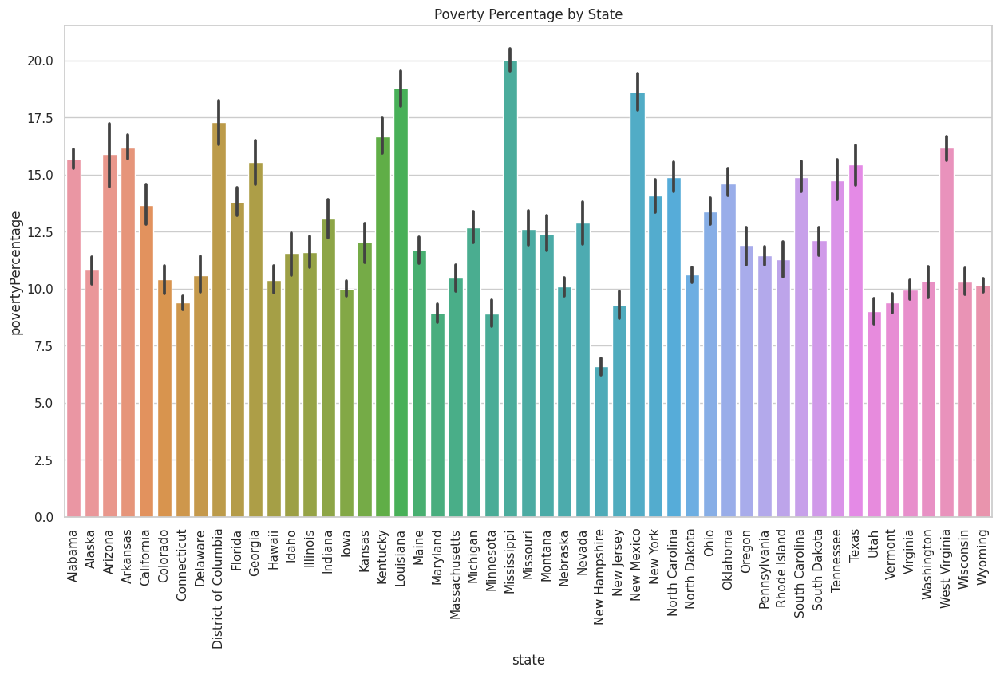

In [101]:
# Visualize the poverty percentage by state
plt.figure(figsize=(15,8))
sn.set(style="whitegrid")
ax = sn.barplot(x="state", y="povertyPercentage", data=df_poverty)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.title('Poverty Percentage by State')
plt.show()

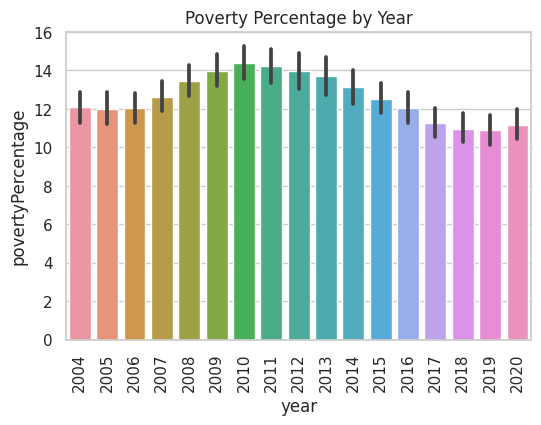

In [102]:
# Visualize the poverty percentage by year
plt.figure(figsize=(6,4))
sn.set(style="whitegrid")
ax = sn.barplot(x="year", y="povertyPercentage", data=df_poverty)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.title('Poverty Percentage by Year')
plt.show()

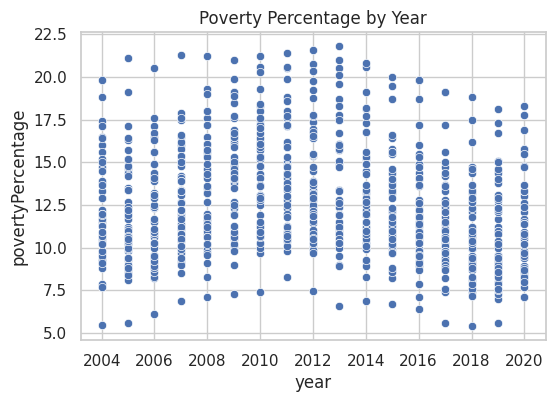

In [103]:
# Visualize any correlations between the poverty percentage and the year
plt.figure(figsize=(6,4))
sn.set(style="whitegrid")
ax = sn.scatterplot(x="year", y="povertyPercentage", data=df_poverty)
plt.title('Poverty Percentage by Year')
plt.show()

In [104]:
# Save the cleaned data to a csv file
df_poverty.to_csv('data/df_poverty_data_understanding.csv', index=False)

### Merge Incidents and Poverty Data

In [105]:
# Filter data by year >= 2013 (we know that incidents are comprised between 2013 and 2018)
df_poverty = df_poverty[df_poverty['year'] >= 2013]

In [106]:
df_incidents = df_incidents_no_outliers

In [107]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145148 entries, 0 to 175717
Data columns (total 18 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         145148 non-null  object 
 1   city_or_county                145148 non-null  object 
 2   latitude                      145148 non-null  float64
 3   longitude                     145148 non-null  float64
 4   congressional_district        145148 non-null  int64  
 5   avg_age_participants          145148 non-null  float64
 6   n_participants_teen           145148 non-null  float64
 7   n_females                     145148 non-null  float64
 8   n_killed                      145148 non-null  int64  
 9   n_injured                     145148 non-null  int64  
 10  n_arrested                    145148 non-null  float64
 11  n_unharmed                    145148 non-null  float64
 12  n_participants                145148 non-nul

In [108]:
df_incidents['datetime'] = pd.to_datetime(df_incidents['datetime'])

In [109]:
# Merge the poverty data with the incidents data
df_incidents_poverty = pd.merge(df_incidents, df_poverty, how='left', left_on=['state', 'year'], right_on=['state', 'year'])

In [110]:
df_incidents_poverty.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145148 entries, 0 to 145147
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         145148 non-null  object        
 1   city_or_county                145148 non-null  object        
 2   latitude                      145148 non-null  float64       
 3   longitude                     145148 non-null  float64       
 4   congressional_district        145148 non-null  int64         
 5   avg_age_participants          145148 non-null  float64       
 6   n_participants_teen           145148 non-null  float64       
 7   n_females                     145148 non-null  float64       
 8   n_killed                      145148 non-null  int64         
 9   n_injured                     145148 non-null  int64         
 10  n_arrested                    145148 non-null  float64       
 11  n_unharmed   

In [111]:
# Check for missing values
df_incidents_poverty.isnull().sum()

state                           0
city_or_county                  0
latitude                        0
longitude                       0
congressional_district          0
avg_age_participants            0
n_participants_teen             0
n_females                       0
n_killed                        0
n_injured                       0
n_arrested                      0
n_unharmed                      0
n_participants                  0
datetime                        0
year                            0
males_ratio                     0
females_ratio                   0
state_congressional_district    0
povertyPercentage               0
dtype: int64

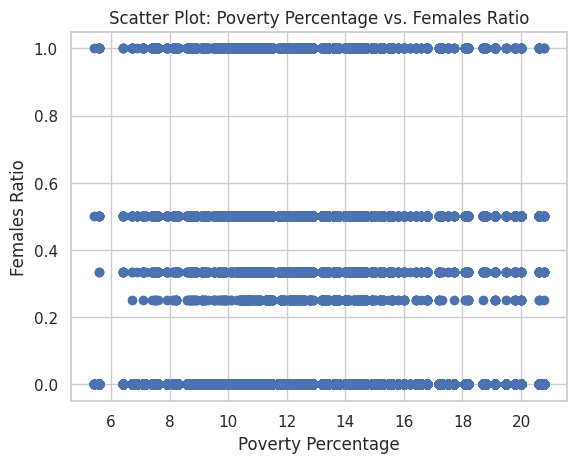

In [112]:
# Scatter Plot
plt.scatter(df_incidents_poverty['povertyPercentage'], df_incidents_poverty['females_ratio'])
plt.xlabel('Poverty Percentage')
plt.ylabel('Females Ratio')
plt.title('Scatter Plot: Poverty Percentage vs. Females Ratio')
plt.show()

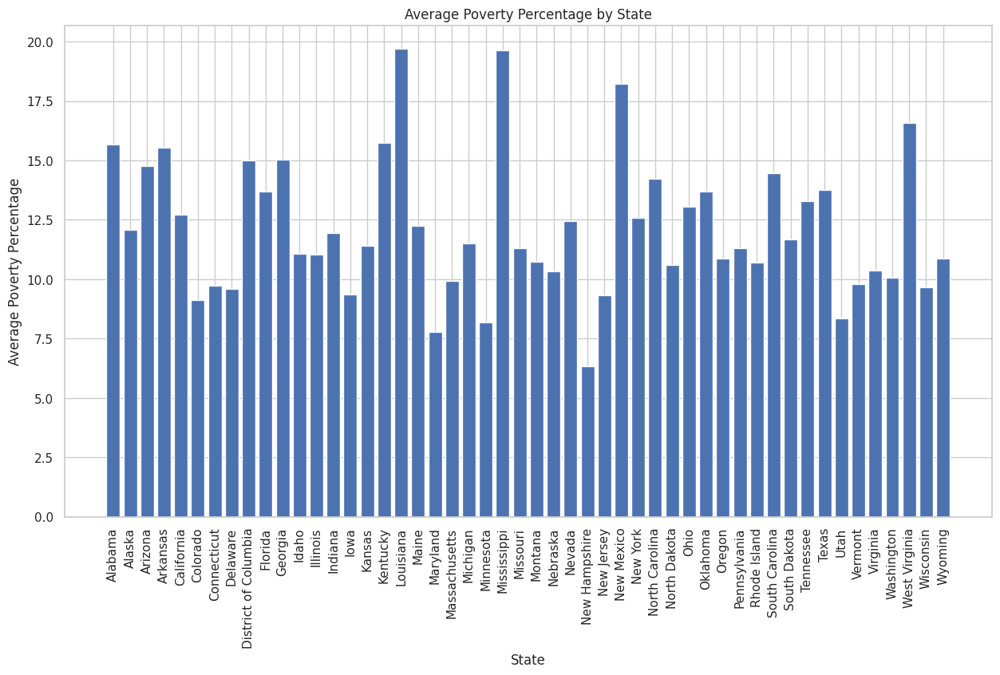

In [113]:
# Bar Plot
avg_poverty_by_state = df_incidents_poverty.groupby('state')['povertyPercentage'].mean().reset_index()
plt.bar(avg_poverty_by_state['state'], avg_poverty_by_state['povertyPercentage'])
plt.xlabel('State')
plt.ylabel('Average Poverty Percentage')
plt.title('Average Poverty Percentage by State')
plt.xticks(rotation=90)
#Size the plot to fit the labels
plt.gcf().set_size_inches(15, 8)
plt.show()

In [114]:
# Map Visualization
fig = px.scatter_mapbox(df_incidents_poverty,
                        lat="latitude",
                        lon="longitude",
                        hover_name="state",
                        color="povertyPercentage",
                        color_continuous_scale='Viridis',
                        size="n_participants",
                        zoom=3,
                        height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

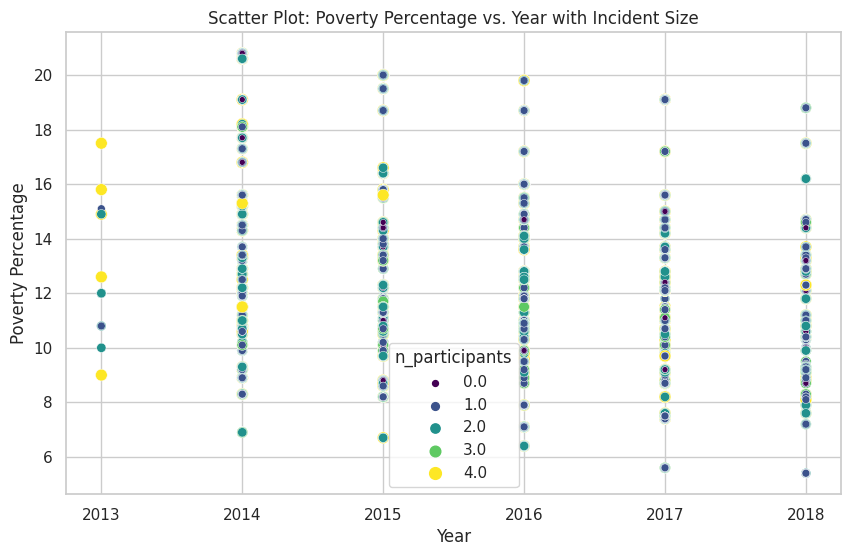

In [115]:
# Scatter Plot
fig, ax = plt.subplots(figsize=(10, 6))
sn.scatterplot(x='year', y='povertyPercentage', size='n_participants', hue='n_participants',
                palette='viridis', data=df_incidents_poverty, ax=ax)
ax.set_xlabel('Year')
ax.set_ylabel('Poverty Percentage')
ax.set_title('Scatter Plot: Poverty Percentage vs. Year with Incident Size')
plt.show()

In [116]:
# Interactive Scatter Plot using Plotly
fig = px.scatter(df_incidents_poverty, x='year', y='povertyPercentage', size='n_participants',
                 color='n_participants', hover_name='state', title='Interactive Scatter Plot: Poverty Percentage vs. Year with Incident Size')
fig.update_layout(xaxis_title='Year', yaxis_title='Poverty Percentage')
fig.show()

In [117]:
df_incidents_poverty.to_csv('data/df_incidents_poverty.csv', index=False)

# Ingest Year State District House Data Set

In [118]:
df_ysdh = pd.read_csv('data/year_state_district_house.csv')

In [119]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10441 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10441 non-null  int64 
 1   state                   10441 non-null  object
 2   congressional_district  10441 non-null  int64 
 3   party                   10441 non-null  object
 4   candidatevotes          10441 non-null  int64 
 5   totalvotes              10441 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 489.5+ KB


In [120]:
df_ysdh['state'].value_counts()

CALIFORNIA              1196
NEW YORK                 748
TEXAS                    735
FLORIDA                  543
PENNSYLVANIA             497
ILLINOIS                 484
OHIO                     454
MICHIGAN                 385
NEW JERSEY               317
NORTH CAROLINA           292
GEORGIA                  284
VIRGINIA                 256
MASSACHUSETTS            245
INDIANA                  232
TENNESSEE                213
MISSOURI                 213
WASHINGTON               211
WISCONSIN                205
MINNESOTA                192
MARYLAND                 192
LOUISIANA                170
ALABAMA                  168
ARIZONA                  161
COLORADO                 153
KENTUCKY                 152
SOUTH CAROLINA           150
CONNECTICUT              133
OKLAHOMA                 133
IOWA                     122
OREGON                   118
MISSISSIPPI              109
KANSAS                   104
ARKANSAS                  96
WEST VIRGINIA             79
UTAH          

In [121]:
# Identify columns with mixed types
mixed_type_cols = df_ysdh.applymap(type).nunique() > 1
mixed_cols = mixed_type_cols.index[mixed_type_cols].tolist()

print("Columns with mixed types:", mixed_cols)

# For each mixed-type column, identify the unique types
for col in mixed_cols:
    unique_types = df_ysdh[col].apply(type).unique()
    print(f"Unique types in column {col}: {unique_types}")

Columns with mixed types: []


#### Syntactics and Semantics on YSDH

In [122]:
# Verify how many records have candidatevotes < 1
condition = df_ysdh['candidatevotes'] < 1
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'candidatevotes < 1'.")
df_ysdh = df_ysdh[df_ysdh['candidatevotes'] >= 1]

Dataframe has 2 entries for which 'candidatevotes < 1'.


In [123]:
# Verify how many records have totalvotes < 1
condition = df_ysdh['totalvotes'] < 1
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'totalvotes < 1'.")
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= 1]

Dataframe has 0 entries for which 'totalvotes < 1'.


In [124]:
# Verify that all records have candidatevotes <= totalvotes
condition = df_ysdh['totalvotes'] < df_ysdh['candidatevotes']
print(f"Dataframe has {len(df_ysdh[condition])} entries for which 'totalvotes < candidatevotes'.")
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= df_ysdh['candidatevotes']]

Dataframe has 0 entries for which 'totalvotes < candidatevotes'.


In [125]:
df_ysdh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10439 entries, 0 to 10440
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   year                    10439 non-null  int64 
 1   state                   10439 non-null  object
 2   congressional_district  10439 non-null  int64 
 3   party                   10439 non-null  object
 4   candidatevotes          10439 non-null  int64 
 5   totalvotes              10439 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 570.9+ KB


In [126]:
numerical_fields = ['candidatevotes', 'totalvotes']

We do now convert states to be equal (as strings) to the ones already in Incidents and Poverty dataset.

In [127]:
def convert_states(x: str):
  return x.title() if x != 'DISTRICT OF COLUMBIA' else 'District of Columbia'

In [128]:
df_ysdh['state'] = df_ysdh['state'].apply(convert_states)

In [129]:
l = df_ysdh['state'].unique()
print(len(l), sorted(l), sep='\n')

51
['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming']


In [130]:
m = df_incidents_poverty['state'].unique()
print(len(m), sorted(m), sep='\n')

50
['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'District of Columbia', 'Florida', 'Georgia', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming']


In [131]:
set(l).difference(df_incidents_poverty['state'].unique())

{'Hawaii'}

In [132]:
set(df_incidents_poverty['state'].unique()).difference(l)

set()

As we can see, a side effect of outlier removal for Incidents and Poverty Dataset is that all incidents in Hawaii have disappeared.

In [133]:
# A quick look to the available parties
df_ysdh['party'].value_counts()

DEMOCRAT                   5512
REPUBLICAN                 4856
DEMOCRATIC-FARMER-LABOR      58
INDEPENDENT                  10
INDEPENDENT-REPUBLICAN        2
FOGLIETTA (DEMOCRAT)          1
Name: party, dtype: int64

#### Visualizing YSDH

<Axes: xlabel='Total Votes', ylabel='Frequency'>

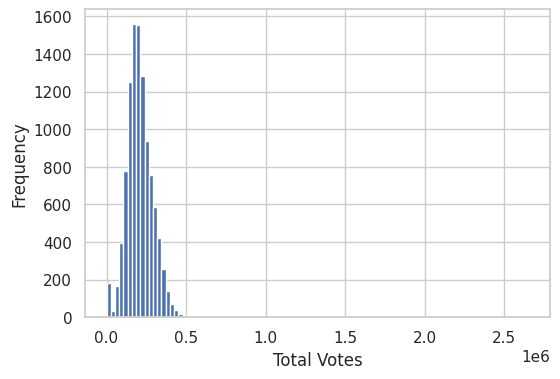

In [134]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

In [135]:
len(df_ysdh[df_ysdh['totalvotes'] > 0.5e6])

6

In [136]:
df_ysdh = df_ysdh[df_ysdh['totalvotes'] < 0.5e6]

<Axes: xlabel='Total Votes', ylabel='Frequency'>

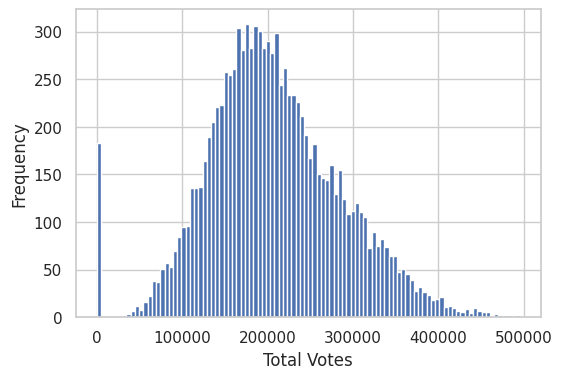

In [137]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

As we can see, there is a very high number of items for which there are $< 20000$ votes.

In [138]:
df_ysdh[df_ysdh['totalvotes'] < 20_000].max(), len(df_ysdh[df_ysdh['totalvotes'] < 20_000])

(year                            2022
 state                       Oklahoma
 congressional_district            27
 party                     REPUBLICAN
 candidatevotes                     1
 totalvotes                         1
 dtype: object,
 183)

In [139]:
# Since we got that the maximum values for candidatevotes and totalvotes is 1, we can safely remove them
df_ysdh = df_ysdh[df_ysdh['totalvotes'] >= 20_000]

<Axes: xlabel='Total Votes', ylabel='Frequency'>

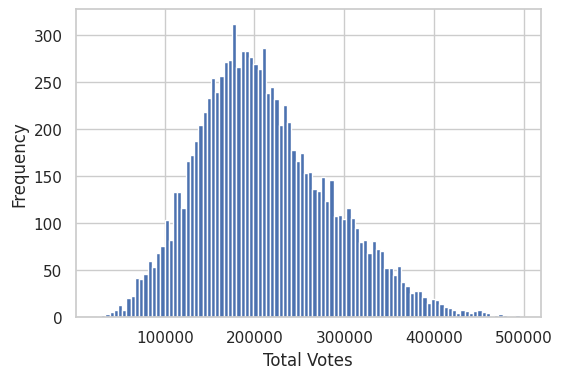

In [140]:
plt.figure(figsize=(6, 4))
plt.xlabel('Total Votes')
df_ysdh['totalvotes'].plot(kind='hist', bins=100)

<Axes: xlabel='Candidate Votes', ylabel='Frequency'>

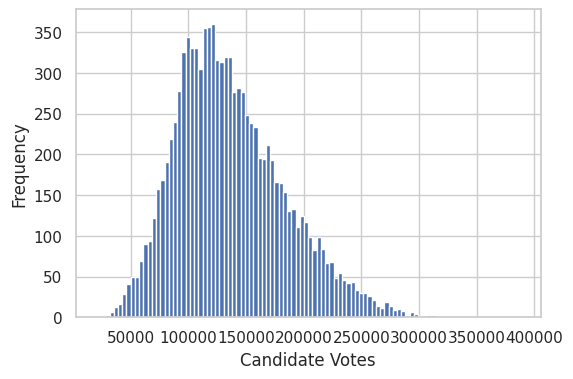

In [141]:
plt.figure(figsize=(6, 4))
plt.xlabel('Candidate Votes')
df_ysdh['candidatevotes'].plot(kind='hist', bins=100)

In [142]:
# Filter by year
df_ysdh_post = df_ysdh[df_ysdh['year'] >= 2013]

We do now show how actually there are differences in the number of congressional districts for each state in the two dataset, and which are the actually missing ones from both.

In [143]:
# Take and print minimum and maximum congressional district for each state in incidents and poverty dataset
incidents_min_max = []
for state in df_incidents_poverty['state'].unique():
  state_df = df_incidents_poverty[df_incidents_poverty['state'] == state]['congressional_district']
  m, M = state_df.min(), state_df.max()
  incidents_min_max.append((state, m, M))
  print(f"{state}: min = {m}, max = {M}")

Indiana: min = 1, max = 9
Pennsylvania: min = 1, max = 18
Oklahoma: min = 1, max = 5
New York: min = 1, max = 27
Missouri: min = 1, max = 8
California: min = 1, max = 53
Illinois: min = 1, max = 18
Washington: min = 1, max = 10
Florida: min = 1, max = 27
South Carolina: min = 1, max = 7
Georgia: min = 1, max = 14
Massachusetts: min = 1, max = 9
Connecticut: min = 1, max = 5
Rhode Island: min = 1, max = 2
Tennessee: min = 1, max = 9
Virginia: min = 1, max = 11
New Jersey: min = 1, max = 12
Michigan: min = 1, max = 14
Maine: min = 1, max = 2
Texas: min = 1, max = 36
Ohio: min = 1, max = 16
Colorado: min = 1, max = 7
Maryland: min = 1, max = 8
South Dakota: min = 0, max = 1
Kentucky: min = 1, max = 8
Arizona: min = 1, max = 9
Minnesota: min = 1, max = 8
Wisconsin: min = 1, max = 8
Alabama: min = 1, max = 7
Kansas: min = 1, max = 4
North Carolina: min = 1, max = 13
Iowa: min = 1, max = 4
Louisiana: min = 1, max = 6
Mississippi: min = 1, max = 4
West Virginia: min = 1, max = 6
Nevada: min =

In [144]:
# Take and print minimum and maximum congressional district for each state in ysdh dataset
ysdh_min_max = []
for state in df_ysdh_post['state'].unique():
  state_df = df_ysdh_post[df_ysdh_post['state'] == state]['congressional_district']
  m, M = state_df.min(), state_df.max()
  ysdh_min_max.append((state, m, M))
  print(f"{state}: min = {m}, max = {M}")

Alabama: min = 1, max = 7
Alaska: min = 0, max = 0
Arizona: min = 1, max = 9
Arkansas: min = 1, max = 4
California: min = 1, max = 53
Colorado: min = 1, max = 8
Connecticut: min = 1, max = 5
Delaware: min = 0, max = 0
Florida: min = 1, max = 28
Georgia: min = 1, max = 14
Hawaii: min = 1, max = 2
Idaho: min = 1, max = 2
Illinois: min = 1, max = 18
Indiana: min = 1, max = 9
Iowa: min = 1, max = 4
Kansas: min = 1, max = 4
Kentucky: min = 1, max = 6
Louisiana: min = 1, max = 6
Maine: min = 1, max = 2
Maryland: min = 1, max = 8
Massachusetts: min = 1, max = 9
Michigan: min = 1, max = 14
Minnesota: min = 1, max = 8
Mississippi: min = 1, max = 4
Missouri: min = 1, max = 8
Montana: min = 0, max = 2
Nebraska: min = 1, max = 3
Nevada: min = 1, max = 4
New Hampshire: min = 1, max = 2
New Jersey: min = 1, max = 12
New Mexico: min = 1, max = 3
New York: min = 1, max = 27
North Carolina: min = 1, max = 14
North Dakota: min = 0, max = 0
Ohio: min = 1, max = 16
Oklahoma: min = 1, max = 5
Oregon: min =

In [145]:
# Rebuild them as hashmaps
incidents_map = {k: (p, q) for (k, p, q) in incidents_min_max}
ysdh_map = {k: (p, q) for (k, p, q) in ysdh_min_max}

In [146]:
# Compare each minimum and maximum in both datasets for each state
for k in incidents_map.keys():
  print(k, incidents_map[k], ysdh_map[k])

Indiana (1, 9) (1, 9)
Pennsylvania (1, 18) (1, 18)
Oklahoma (1, 5) (1, 5)
New York (1, 27) (1, 27)
Missouri (1, 8) (1, 8)
California (1, 53) (1, 53)
Illinois (1, 18) (1, 18)
Washington (1, 10) (1, 10)
Florida (1, 27) (1, 28)
South Carolina (1, 7) (1, 7)
Georgia (1, 14) (1, 14)
Massachusetts (1, 9) (1, 9)
Connecticut (1, 5) (1, 5)
Rhode Island (1, 2) (1, 2)
Tennessee (1, 9) (1, 9)
Virginia (1, 11) (1, 11)
New Jersey (1, 12) (1, 12)
Michigan (1, 14) (1, 14)
Maine (1, 2) (1, 2)
Texas (1, 36) (1, 38)
Ohio (1, 16) (1, 16)
Colorado (1, 7) (1, 8)
Maryland (1, 8) (1, 8)
South Dakota (0, 1) (0, 0)
Kentucky (1, 8) (1, 6)
Arizona (1, 9) (1, 9)
Minnesota (1, 8) (1, 8)
Wisconsin (1, 8) (1, 8)
Alabama (1, 7) (1, 7)
Kansas (1, 4) (1, 4)
North Carolina (1, 13) (1, 14)
Iowa (1, 4) (1, 4)
Louisiana (1, 6) (1, 6)
Mississippi (1, 4) (1, 4)
West Virginia (1, 6) (1, 3)
Nevada (1, 4) (1, 4)
Arkansas (1, 4) (1, 4)
Nebraska (1, 3) (1, 3)
Utah (1, 4) (1, 4)
Montana (0, 1) (0, 2)
District of Columbia (1, 8) (0, 

As we can see, as long as the maximum district inside Incidents and Poverty dataset is lower or equal than the corresponding maximum district inside YSDH dataset, there is no risk of losing records when doing the join. We also notice how there is only one district for Alaska and Vermont in both states, but they are enumerated differently.

In [147]:
for k in incidents_map.keys():
  p, q = incidents_map[k], ysdh_map[k]
  if p[1] > q[1]:
    print(k, p, q)

South Dakota (0, 1) (0, 0)
Kentucky (1, 8) (1, 6)
West Virginia (1, 6) (1, 3)
District of Columbia (1, 8) (0, 0)
Delaware (0, 4) (0, 0)
Oregon (1, 10) (1, 6)
Wyoming (0, 1) (0, 0)
Alaska (1, 1) (0, 0)
Vermont (1, 1) (0, 0)
North Dakota (0, 1) (0, 0)


In [148]:
len(df_incidents_poverty[df_incidents_poverty['state'] == 'District of Columbia'])

1601

In [149]:
# Align the enumeration for congressional districts in Alaska and Vermont in YSDH dataset to the one in Incidents one
df_ysdh.loc[df_ysdh['state'].isin(['Alaska', 'Vermont']), 'congressional_district'] += 1

In [150]:
df_ysdh[df_ysdh['state'] == 'Alaska']['congressional_district'].unique()

array([1])

In [151]:
df_ysdh[df_ysdh['state'] == 'Vermont']['congressional_district'].unique()

array([1])

In [152]:
# Create composite key for state and district for the join
df_ysdh['state_congressional_district'] = df_ysdh['state'].str.lower() + '_' + df_ysdh['congressional_district'].astype(str)

In [153]:
df_ysdh.head()

,year,state,congressional_district,party,candidatevotes,totalvotes,state_congressional_district
0,1976,Alabama,1,REPUBLICAN,98257,157170,alabama_1
1,1976,Alabama,2,REPUBLICAN,90069,156362,alabama_2
2,1976,Alabama,3,DEMOCRAT,106935,108048,alabama_3
3,1976,Alabama,4,DEMOCRAT,141490,176022,alabama_4
4,1976,Alabama,5,DEMOCRAT,113553,113560,alabama_5


In [154]:
df_ysdh_no_outliers = df_ysdh.copy()

In [155]:
# Remove outliers with IQR method
for column in ['candidatevotes', 'totalvotes']:
  df_ysdh_no_outliers = iqr_attribute_outliers_remove(df_ysdh_no_outliers, column, threshold=2.0)

candidatevotes has the following: Q1 = 102051.5, Q3 = 166072.0, IQR = 64020.5, Lower Bound = -25989.5, Upper Bound = 294113.0
Identified 28 outliers for columns candidatevotes with threshold = 2.0
Original Dataframe has minimum candidatevotes = 20769, maximum candidatevotes = 387109
Cleaned Dataframe has minimum candidatevotes = 20769, maximum candidatevotes = 293684
totalvotes has the following: Q1 = 158074.0, Q3 = 256002.25, IQR = 97928.25, Lower Bound = -37782.5, Upper Bound = 451858.75
Identified 16 outliers for columns totalvotes with threshold = 2.0
Original Dataframe has minimum totalvotes = 24449, maximum totalvotes = 488270
Cleaned Dataframe has minimum totalvotes = 24449, maximum totalvotes = 450473


In [156]:
# Save the cleaned dataset
df_ysdh_no_outliers.to_csv('data/data_understanding_year_state_district_house.csv', index=False)

# Merging the Three Data Sets

In [157]:
df_ysdh = df_ysdh_no_outliers

In [158]:
df_ysdh.drop(columns=['state'], inplace=True)

In [159]:
df_ysdh['year'].unique()

array([1976, 1978, 1980, 1982, 1984, 1986, 1988, 1990, 1992, 1994, 1996,
       1998, 2000, 2002, 2004, 2006, 2008, 2010, 2012, 2014, 2016, 2018,
       2020, 2022])

In [160]:
df_ysdh = df_ysdh[df_ysdh['year'] >= 2012]

In [161]:
df_ysdh.isnull().sum()

year                            0
congressional_district          0
party                           0
candidatevotes                  0
totalvotes                      0
state_congressional_district    0
dtype: int64

We observe that only **even** years are represented in the dataset, since elections occur every $2$ years. As a consequence, we can duplicate data s.t. for each record with $year = x$ (even), there is an identical record with $year = x+1$, since electoral data will have the same meaning.

In [162]:
df_ysdh_oddy = df_ysdh.copy()
df_ysdh_oddy['year'] = df_ysdh_oddy['year'].apply(lambda x: x+1)

In [163]:
df_ysdh_oddy['year'].unique()

array([2013, 2015, 2017, 2019, 2021, 2023])

In [164]:
# Concatenate the original and odd-years datasets
df_ysdh = pd.concat([df_ysdh, df_ysdh_oddy], axis=0)
df_ysdh['year'].unique()

array([2012, 2014, 2016, 2018, 2020, 2022, 2013, 2015, 2017, 2019, 2021,
       2023])

In [165]:
df_ysdh.drop(columns=['congressional_district'], inplace=True)

We have also observed that there are state_congressional_district values for which **not** all the years are present, as we can see below for `oklahoma_1` (for which $2014$ and $2015$ are missing) and `oklahoma_2` (for which all years are present).

In [166]:
df_ysdh[df_ysdh['state_congressional_district'] == 'oklahoma_1']

,year,party,candidatevotes,totalvotes,state_congressional_district
8144,2012,REPUBLICAN,181084,285312,oklahoma_1
9449,2018,REPUBLICAN,150129,253171,oklahoma_1
9885,2020,REPUBLICAN,213700,335471,oklahoma_1
10319,2022,REPUBLICAN,142800,233495,oklahoma_1
8144,2013,REPUBLICAN,181084,285312,oklahoma_1
9449,2019,REPUBLICAN,150129,253171,oklahoma_1
9885,2021,REPUBLICAN,213700,335471,oklahoma_1
10319,2023,REPUBLICAN,142800,233495,oklahoma_1


In [167]:
df_ysdh[df_ysdh['state_congressional_district'] == 'oklahoma_2']

,year,party,candidatevotes,totalvotes,state_congressional_district
8145,2012,REPUBLICAN,143701,250612,oklahoma_2
8580,2014,REPUBLICAN,110925,158407,oklahoma_2
9015,2016,REPUBLICAN,189839,268870,oklahoma_2
9450,2018,REPUBLICAN,140451,216002,oklahoma_2
9886,2020,REPUBLICAN,216511,288527,oklahoma_2
10320,2022,REPUBLICAN,167843,231672,oklahoma_2
8145,2013,REPUBLICAN,143701,250612,oklahoma_2
8580,2015,REPUBLICAN,110925,158407,oklahoma_2
9015,2017,REPUBLICAN,189839,268870,oklahoma_2
9450,2019,REPUBLICAN,140451,216002,oklahoma_2


In [168]:
df_ysdh['party'].value_counts()

REPUBLICAN                 2650
DEMOCRAT                   2426
DEMOCRATIC-FARMER-LABOR      18
Name: party, dtype: int64

In [169]:
# Merge the poverty_incidents data with the year_state_district_house data for each row in the poverty_incidents data
df_incidents_poverty_house = pd.merge(df_incidents_poverty, df_ysdh, how='left', left_on=['state_congressional_district', 'year'], right_on=['state_congressional_district', 'year'])

In [170]:
#Print head of the merged dataframe
df_incidents_poverty_house.head()

,state,city_or_county,latitude,longitude,congressional_district,avg_age_participants,n_participants_teen,n_females,n_killed,n_injured,...,n_participants,datetime,year,males_ratio,females_ratio,state_congressional_district,povertyPercentage,party,candidatevotes,totalvotes
0,Indiana,Indianapolis,39.8322,-86.2492,7,19.0,0.0,0.0,0,1,...,1.0,2015-05-02,2015,1.0,0.0,indiana_7,12.3,DEMOCRAT,61443.0,112261.0
1,Pennsylvania,Kane,41.6645,-78.7856,5,62.0,0.0,0.0,1,0,...,1.0,2017-04-03,2017,1.0,0.0,pennsylvania_5,10.5,REPUBLICAN,206761.0,307843.0
2,Oklahoma,Tulsa,36.1060,-96.0764,1,20.0,0.0,1.0,0,1,...,1.0,2015-03-22,2015,0.0,1.0,oklahoma_1,13.8,NaN,NaN,NaN
3,New York,Bronx,40.8524,-73.8310,14,29.0,0.0,0.0,0,1,...,3.0,2014-06-19,2014,1.0,0.0,newyork_14,13.4,NaN,NaN,NaN
4,Missouri,Kansas City (Raytown),38.9647,-94.4654,5,29.0,0.0,0.0,0,0,...,1.0,2016-12-21,2016,1.0,0.0,missouri_5,11.9,DEMOCRAT,190766.0,324270.0


In [171]:
# Check basic information about the merged dataframe
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145148 entries, 0 to 145147
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         145148 non-null  object        
 1   city_or_county                145148 non-null  object        
 2   latitude                      145148 non-null  float64       
 3   longitude                     145148 non-null  float64       
 4   congressional_district        145148 non-null  int64         
 5   avg_age_participants          145148 non-null  float64       
 6   n_participants_teen           145148 non-null  float64       
 7   n_females                     145148 non-null  float64       
 8   n_killed                      145148 non-null  int64         
 9   n_injured                     145148 non-null  int64         
 10  n_arrested                    145148 non-null  float64       
 11  n_unharmed   

In [172]:
# Check for missing values
df_incidents_poverty_house.isnull().sum()

state                               0
city_or_county                      0
latitude                            0
longitude                           0
congressional_district              0
avg_age_participants                0
n_participants_teen                 0
n_females                           0
n_killed                            0
n_injured                           0
n_arrested                          0
n_unharmed                          0
n_participants                      0
datetime                            0
year                                0
males_ratio                         0
females_ratio                       0
state_congressional_district        0
povertyPercentage                   0
party                           29771
candidatevotes                  29771
totalvotes                      29771
dtype: int64

We now see which are the actual state_congressional_district for which there are missing values (i.e., missing data in ysdh dataset).

In [173]:
merged_nulls = df_incidents_poverty_house[df_incidents_poverty_house.isnull().any(axis=1)]

In [174]:
sorted(merged_nulls['state_congressional_district'].unique())

['colorado_2',
 'delaware_1',
 'delaware_4',
 'districtofcolumbia_1',
 'districtofcolumbia_4',
 'districtofcolumbia_8',
 'florida_10',
 'florida_12',
 'florida_14',
 'florida_21',
 'florida_24',
 'florida_25',
 'florida_27',
 'kentucky_8',
 'massachusetts_6',
 'montana_0',
 'montana_1',
 'newhampshire_1',
 'newhampshire_2',
 'newjersey_1',
 'newjersey_10',
 'newjersey_11',
 'newjersey_12',
 'newjersey_2',
 'newjersey_3',
 'newjersey_4',
 'newjersey_5',
 'newjersey_6',
 'newjersey_7',
 'newjersey_8',
 'newjersey_9',
 'newmexico_1',
 'newmexico_2',
 'newmexico_3',
 'newyork_1',
 'newyork_10',
 'newyork_11',
 'newyork_12',
 'newyork_13',
 'newyork_14',
 'newyork_15',
 'newyork_16',
 'newyork_17',
 'newyork_18',
 'newyork_19',
 'newyork_2',
 'newyork_20',
 'newyork_21',
 'newyork_22',
 'newyork_23',
 'newyork_24',
 'newyork_25',
 'newyork_26',
 'newyork_27',
 'newyork_3',
 'newyork_4',
 'newyork_5',
 'newyork_6',
 'newyork_7',
 'newyork_8',
 'newyork_9',
 'northcarolina_1',
 'northcarolina

In [175]:
# Check for percentage of missing values
100 * df_incidents_poverty_house.isnull().sum()/len(df_incidents_poverty_house)

state                            0.000000
city_or_county                   0.000000
latitude                         0.000000
longitude                        0.000000
congressional_district           0.000000
avg_age_participants             0.000000
n_participants_teen              0.000000
n_females                        0.000000
n_killed                         0.000000
n_injured                        0.000000
n_arrested                       0.000000
n_unharmed                       0.000000
n_participants                   0.000000
datetime                         0.000000
year                             0.000000
males_ratio                      0.000000
females_ratio                    0.000000
state_congressional_district     0.000000
povertyPercentage                0.000000
party                           20.510789
candidatevotes                  20.510789
totalvotes                      20.510789
dtype: float64

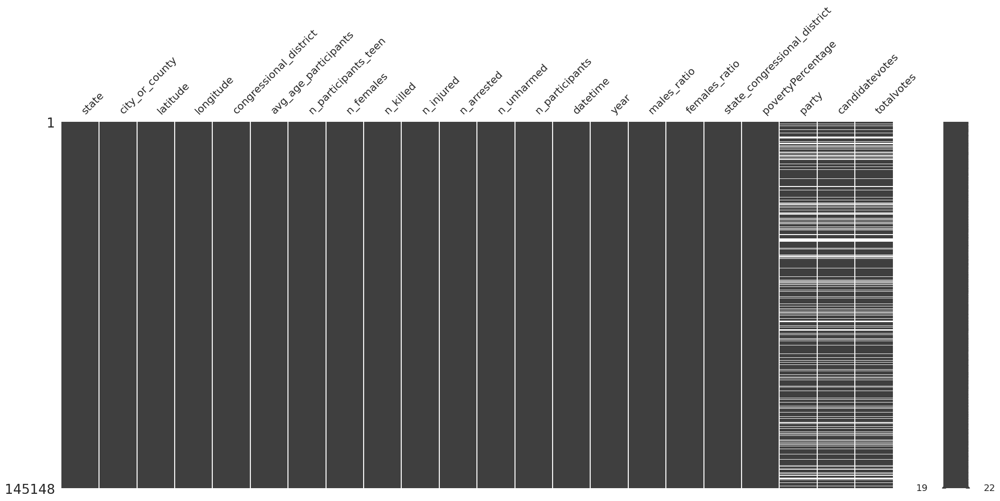

<Figure size 1500x900 with 0 Axes>

In [176]:
# Vidualize the missing values
msno.matrix(df_incidents_poverty_house)
plt.figure(figsize = (15,9))
plt.show()

In [177]:
df_incidents_poverty_house.dropna(subset=['party', 'candidatevotes', 'totalvotes'], inplace=True)

In [178]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115377 entries, 0 to 145147
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         115377 non-null  object        
 1   city_or_county                115377 non-null  object        
 2   latitude                      115377 non-null  float64       
 3   longitude                     115377 non-null  float64       
 4   congressional_district        115377 non-null  int64         
 5   avg_age_participants          115377 non-null  float64       
 6   n_participants_teen           115377 non-null  float64       
 7   n_females                     115377 non-null  float64       
 8   n_killed                      115377 non-null  int64         
 9   n_injured                     115377 non-null  int64         
 10  n_arrested                    115377 non-null  float64       
 11  n_unharmed   

In [179]:
df_incidents_poverty_house.to_csv('data/df_incidents_poverty_house_temp.csv', index=False)

## Handling  Outliers in the Merged Data

<Axes: >

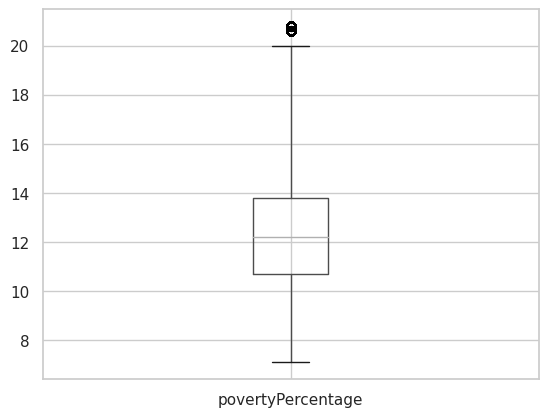

In [180]:
# Examine the distribution of the poverty percentage
df_incidents_poverty_house.boxplot(column=['povertyPercentage'], whis=2.0)

In [181]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115377 entries, 0 to 145147
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         115377 non-null  object        
 1   city_or_county                115377 non-null  object        
 2   latitude                      115377 non-null  float64       
 3   longitude                     115377 non-null  float64       
 4   congressional_district        115377 non-null  int64         
 5   avg_age_participants          115377 non-null  float64       
 6   n_participants_teen           115377 non-null  float64       
 7   n_females                     115377 non-null  float64       
 8   n_killed                      115377 non-null  int64         
 9   n_injured                     115377 non-null  int64         
 10  n_arrested                    115377 non-null  float64       
 11  n_unharmed   

In [182]:
df_incidents_poverty_house_no_outliers = df_incidents_poverty_house.copy()

In [183]:
# Outliers removal with IQR method
for column in ['povertyPercentage', 'candidatevotes', 'totalvotes']:
  df_incidents_poverty_house_no_outliers = iqr_attribute_outliers_remove(df_incidents_poverty_house_no_outliers, column, threshold=2)

povertyPercentage has the following: Q1 = 10.7, Q3 = 13.8, IQR = 3.1000000000000014, Lower Bound = 4.4999999999999964, Upper Bound = 20.000000000000004
Identified 1275 outliers for columns povertyPercentage with threshold = 2
Original Dataframe has minimum povertyPercentage = 7.1, maximum povertyPercentage = 20.8
Cleaned Dataframe has minimum povertyPercentage = 7.1, maximum povertyPercentage = 20.0
candidatevotes has the following: Q1 = 130752.0, Q3 = 208598.0, IQR = 77846.0, Lower Bound = -24940.0, Upper Bound = 364290.0
Identified 0 outliers for columns candidatevotes with threshold = 2
Original Dataframe has minimum candidatevotes = 30208.0, maximum candidatevotes = 293684.0
Cleaned Dataframe has minimum candidatevotes = 30208.0, maximum candidatevotes = 293684.0
totalvotes has the following: Q1 = 188523.0, Q3 = 309645.0, IQR = 121122.0, Lower Bound = -53721.0, Upper Bound = 551889.0
Identified 0 outliers for columns totalvotes with threshold = 2
Original Dataframe has minimum tota

<Axes: xlabel='Poverty Percentage', ylabel='Frequency'>

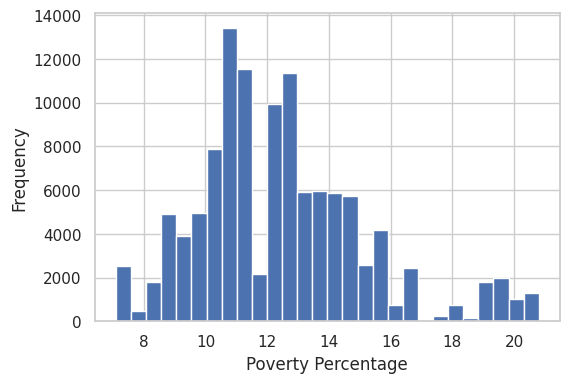

In [184]:
plt.figure(figsize=(6, 4))
plt.xlabel('Poverty Percentage')
df_incidents_poverty_house['povertyPercentage'].plot(kind='hist', bins=28)

In [185]:
# Export the cleaned data to a csv file
df_incidents_poverty_house.to_csv('data/df_incidents_poverty_house_data_preparation_before_features.csv', index=False)

In [186]:
df_incidents_poverty_house = pd.read_csv('data/df_incidents_poverty_house_data_preparation_before_features.csv')

In [187]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115377 entries, 0 to 115376
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   state                         115377 non-null  object 
 1   city_or_county                115377 non-null  object 
 2   latitude                      115377 non-null  float64
 3   longitude                     115377 non-null  float64
 4   congressional_district        115377 non-null  int64  
 5   avg_age_participants          115377 non-null  float64
 6   n_participants_teen           115377 non-null  float64
 7   n_females                     115377 non-null  float64
 8   n_killed                      115377 non-null  int64  
 9   n_injured                     115377 non-null  int64  
 10  n_arrested                    115377 non-null  float64
 11  n_unharmed                    115377 non-null  float64
 12  n_participants                115377 non-nul

<ipython-input-188-01958707a7b7>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



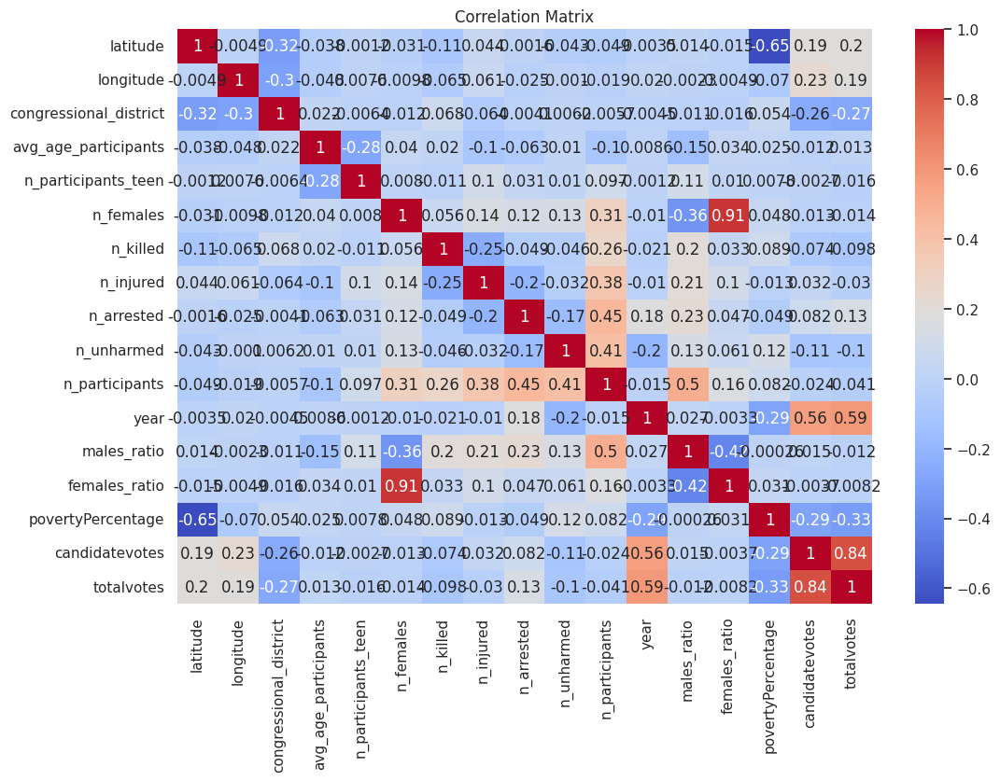

In [188]:
correlation_matrix = df_incidents_poverty_house.corr()
plt.figure(figsize=(12,8))
sn.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

## Features Definition
We define the following new features for the dataset:

1. Males Ratio (n_males / MAX(n_participants, 1))
2. Killed Ratio (n_killed / MAX(n_participants, 1))
3. Injured Ratio (n_injured / MAX(n_participants, 1))
4. Unharmed Ratio (n_unharmed / MAX(n_participants, 1))
5. Males In Month Ratio (n_males / #males[state_congressional_district and same month])
6. Killed In Month Ratio (n_killed / #killed[state_congressional_district and same month])
7. Injured In Month Ratio (n_injured / #injured[state_congressional_district and same month])
8. Unharmed In Month Ratio (n_unharmed / #unharmed[state_congressional_district and same month])
9. Candidate Winning Ratio (candidatevotes / totalvotes)

We will insert them in the dataset and keep together with: latitude, longitude, avg_age_participants, povertyPercentage.

In [189]:
df_participants = df_incidents_poverty_house['n_participants'].apply(lambda x: max(x, 1))

In [190]:
df_incidents_poverty_house['killed_ratio'] = df_incidents_poverty_house['n_killed'] / df_participants
df_incidents_poverty_house['injured_ratio'] = df_incidents_poverty_house['n_injured'] / df_participants
df_incidents_poverty_house['unharmed_ratio'] = df_incidents_poverty_house['n_unharmed'] / df_participants
df_incidents_poverty_house['candidate_winning_ratio'] = df_incidents_poverty_house['candidatevotes'] / df_incidents_poverty_house['totalvotes']

In [191]:
df_incidents_poverty_house.isnull().sum()

state                           0
city_or_county                  0
latitude                        0
longitude                       0
congressional_district          0
avg_age_participants            0
n_participants_teen             0
n_females                       0
n_killed                        0
n_injured                       0
n_arrested                      0
n_unharmed                      0
n_participants                  0
datetime                        0
year                            0
males_ratio                     0
females_ratio                   0
state_congressional_district    0
povertyPercentage               0
party                           0
candidatevotes                  0
totalvotes                      0
killed_ratio                    0
injured_ratio                   0
unharmed_ratio                  0
candidate_winning_ratio         0
dtype: int64

In [192]:
df_incidents_poverty_house['datetime'] = pd.to_datetime(df_incidents_poverty_house['datetime'])

In [193]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115377 entries, 0 to 115376
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         115377 non-null  object        
 1   city_or_county                115377 non-null  object        
 2   latitude                      115377 non-null  float64       
 3   longitude                     115377 non-null  float64       
 4   congressional_district        115377 non-null  int64         
 5   avg_age_participants          115377 non-null  float64       
 6   n_participants_teen           115377 non-null  float64       
 7   n_females                     115377 non-null  float64       
 8   n_killed                      115377 non-null  int64         
 9   n_injured                     115377 non-null  int64         
 10  n_arrested                    115377 non-null  float64       
 11  n_unharmed   

In [194]:
df_incidents_poverty_house['n_males'] = df_incidents_poverty_house['n_participants'] - df_incidents_poverty_house['n_females']

In [195]:
df_totals = df_incidents_poverty_house.groupby(['state_congressional_district', df_incidents_poverty_house['datetime'].dt.month])

In [196]:
df_incidents_poverty_house['males_in_month_ratio'] = df_incidents_poverty_house['n_males'] / df_totals['n_males'].transform('sum')
df_incidents_poverty_house['killed_in_month_ratio'] = df_incidents_poverty_house['n_killed'] / df_totals['n_killed'].transform('sum')
df_incidents_poverty_house['injured_in_month_ratio'] = df_incidents_poverty_house['n_injured'] / df_totals['n_injured'].transform('sum')
df_incidents_poverty_house['unharmed_in_month_ratio'] = df_incidents_poverty_house['n_unharmed'] / df_totals['n_unharmed'].transform('sum')

In [197]:
df_incidents_poverty_house.isnull().sum()

state                              0
city_or_county                     0
latitude                           0
longitude                          0
congressional_district             0
avg_age_participants               0
n_participants_teen                0
n_females                          0
n_killed                           0
n_injured                          0
n_arrested                         0
n_unharmed                         0
n_participants                     0
datetime                           0
year                               0
males_ratio                        0
females_ratio                      0
state_congressional_district       0
povertyPercentage                  0
party                              0
candidatevotes                     0
totalvotes                         0
killed_ratio                       0
injured_ratio                      0
unharmed_ratio                     0
candidate_winning_ratio            0
n_males                            0
m

In [198]:
len(df_incidents_poverty_house[df_incidents_poverty_house['unharmed_in_month_ratio'] == 1])

713

In [199]:
df = df_incidents_poverty_house.copy()

In [200]:
df_incidents_poverty_house.dropna(subset=['males_in_month_ratio', 'killed_in_month_ratio', 'injured_in_month_ratio', 'unharmed_in_month_ratio'], inplace=True)

In [201]:
df_incidents_poverty_house.isnull().sum()

state                           0
city_or_county                  0
latitude                        0
longitude                       0
congressional_district          0
avg_age_participants            0
n_participants_teen             0
n_females                       0
n_killed                        0
n_injured                       0
n_arrested                      0
n_unharmed                      0
n_participants                  0
datetime                        0
year                            0
males_ratio                     0
females_ratio                   0
state_congressional_district    0
povertyPercentage               0
party                           0
candidatevotes                  0
totalvotes                      0
killed_ratio                    0
injured_ratio                   0
unharmed_ratio                  0
candidate_winning_ratio         0
n_males                         0
males_in_month_ratio            0
killed_in_month_ratio           0
injured_in_mon

In [202]:
len(df_incidents_poverty_house)

108564

In [203]:
df_incidents_poverty_house['year'].value_counts()

2017    29496
2016    27644
2015    25487
2014    20307
2018     5620
2013       10
Name: year, dtype: int64

In [204]:
df_incidents_poverty_house['males_ratio'].value_counts()

1.000000    78258
0.000000    20194
0.500000     7802
0.666667     1882
0.750000      428
Name: males_ratio, dtype: int64

In [205]:
df = df_incidents_poverty_house.copy()

In [206]:
df['month'] = df['datetime'].dt.month

In [207]:
count_by_month_year = df.groupby(['month', 'year']).size().reset_index(name='Count')
count_by_month_year

,month,year,Count
0,1,2014,1629
1,1,2015,1897
2,1,2016,2259
3,1,2017,2791
4,1,2018,2308
5,2,2014,1208
6,2,2015,1409
7,2,2016,1997
8,2,2017,2429
9,2,2018,1467


In [208]:
# We now drop the columns we do not want to use, except for state_congressional_district (we will use it for clustering and as a unique key in general)
columns_to_drop = [
    'congressional_district', 'n_participants_teen', 'n_females', 'n_males',
    'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants',
    'females_ratio', 'party', 'candidatevotes', 'totalvotes', 'year'
]

In [209]:
df_incidents_poverty_house.drop(columns=columns_to_drop, inplace=True)

In [210]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108564 entries, 0 to 115376
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         108564 non-null  object        
 1   city_or_county                108564 non-null  object        
 2   latitude                      108564 non-null  float64       
 3   longitude                     108564 non-null  float64       
 4   avg_age_participants          108564 non-null  float64       
 5   datetime                      108564 non-null  datetime64[ns]
 6   males_ratio                   108564 non-null  float64       
 7   state_congressional_district  108564 non-null  object        
 8   povertyPercentage             108564 non-null  float64       
 9   killed_ratio                  108564 non-null  float64       
 10  injured_ratio                 108564 non-null  float64       
 11  unharmed_rati

Now let's do some additional data visualization.

<ipython-input-211-01958707a7b7>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



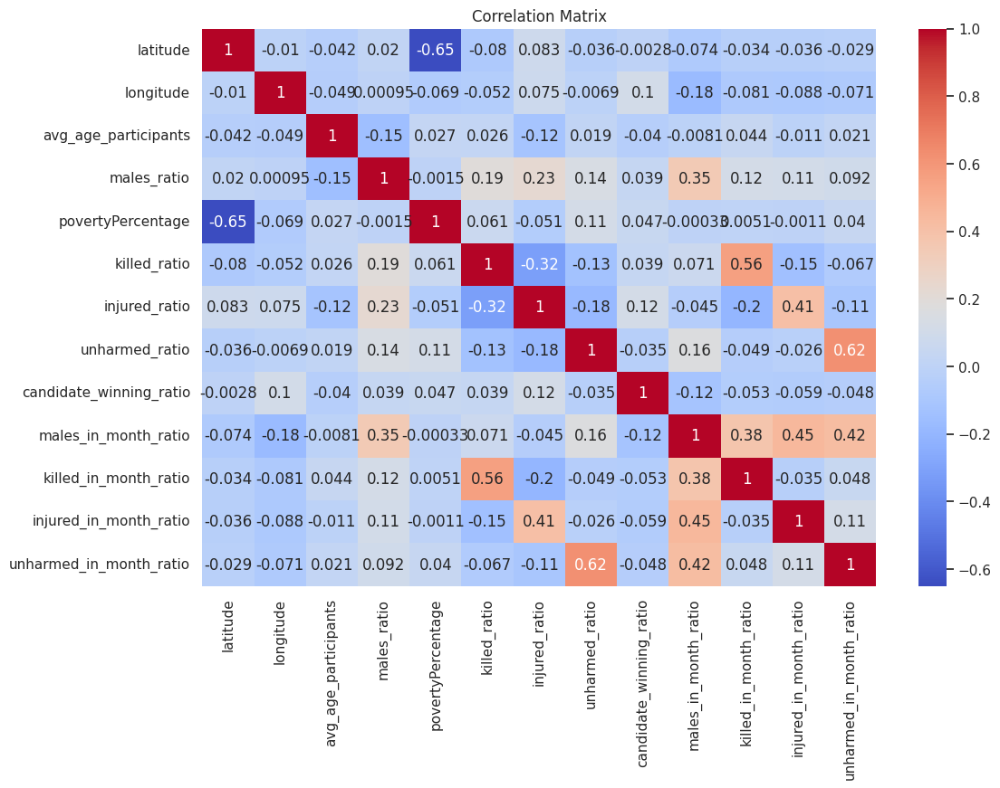

In [211]:
correlation_matrix = df_incidents_poverty_house.corr()
plt.figure(figsize=(12,8))
sn.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

We now visualize and remove outliers.

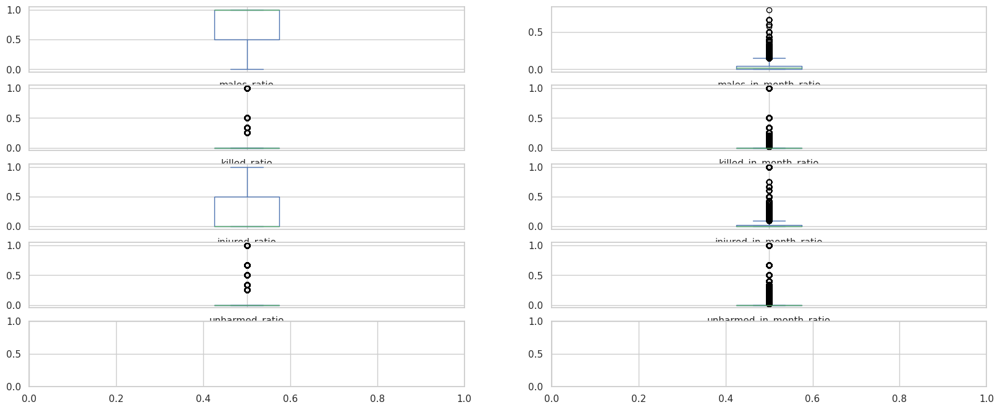

In [212]:
%matplotlib inline
num_rows, num_cols = 5, 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,8))
axes = axes.flatten()
columns = [
    'males_ratio', 'males_in_month_ratio', 'killed_ratio', 'killed_in_month_ratio',
    'injured_ratio', 'injured_in_month_ratio', 'unharmed_ratio', 'unharmed_in_month_ratio',
]

for i, column in enumerate(columns):
    ax = axes[i]
    df_incidents_poverty_house[column].plot(kind='box', ax=ax, whis=3.0)
    ax.grid(True)

In [213]:
columns_with_outliers = ['males_in_month_ratio', 'injured_in_month_ratio', 'killed_ratio', 'killed_in_month_ratio', 'unharmed_ratio', 'unharmed_in_month_ratio', 'candidate_winning_ratio', 'povertyPercentage']

In [214]:
df_incidents_poverty_house_no_outliers = df_incidents_poverty_house.copy()

We prefer to use Z-Score method for outliers removal here since IQR "flattens too much" the range of values for many features.

In [215]:
for column in columns_with_outliers:
  df_incidents_poverty_house_no_outliers = z_score_attribute_outliers_remove(df_incidents_poverty_house_no_outliers, column, threshold=3)

Identified 2123 outliers for columns males_in_month_ratio with threshold = 3
Original Dataframe has minimum males_in_month_ratio = 0.0, maximum males_in_month_ratio = 0.8
Cleaned Dataframe has minimum males_in_month_ratio = 0.0, maximum males_in_month_ratio = 0.15789473684210525
Identified 2533 outliers for columns injured_in_month_ratio with threshold = 3
Original Dataframe has minimum injured_in_month_ratio = 0.0, maximum injured_in_month_ratio = 1.0
Cleaned Dataframe has minimum injured_in_month_ratio = 0.0, maximum injured_in_month_ratio = 0.23076923076923078
Identified 0 outliers for columns killed_ratio with threshold = 3
Original Dataframe has minimum killed_ratio = 0.0, maximum killed_ratio = 1.0
Cleaned Dataframe has minimum killed_ratio = 0.0, maximum killed_ratio = 1.0
Identified 1952 outliers for columns killed_in_month_ratio with threshold = 3
Original Dataframe has minimum killed_in_month_ratio = 0.0, maximum killed_in_month_ratio = 1.0
Cleaned Dataframe has minimum kille

In [216]:
df_incidents_poverty_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108564 entries, 0 to 115376
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   state                         108564 non-null  object        
 1   city_or_county                108564 non-null  object        
 2   latitude                      108564 non-null  float64       
 3   longitude                     108564 non-null  float64       
 4   avg_age_participants          108564 non-null  float64       
 5   datetime                      108564 non-null  datetime64[ns]
 6   males_ratio                   108564 non-null  float64       
 7   state_congressional_district  108564 non-null  object        
 8   povertyPercentage             108564 non-null  float64       
 9   killed_ratio                  108564 non-null  float64       
 10  injured_ratio                 108564 non-null  float64       
 11  unharmed_rati

In [217]:
df_incidents_poverty_house = df_incidents_poverty_house_no_outliers
df_incidents_poverty_house.to_csv('data/df_incidents_poverty_house_data_preparation_final.csv', index=False)

In [218]:
len(df_incidents_poverty_house[df_incidents_poverty_house['killed_ratio'] > 0])

21531

In [219]:
len(df_incidents_poverty_house)

92561

In [220]:
df_incidents_poverty_house.describe()

,latitude,longitude,avg_age_participants,males_ratio,povertyPercentage,killed_ratio,injured_ratio,unharmed_ratio,candidate_winning_ratio,males_in_month_ratio,killed_in_month_ratio,injured_in_month_ratio,unharmed_in_month_ratio
count,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000,92561.000000
mean,37.571528,-89.970654,30.901254,0.750367,12.417237,0.172228,0.314412,0.045845,0.696398,0.024326,0.022091,0.021347,0.008808
std,4.829544,13.116223,10.983214,0.409529,2.721521,0.339893,0.429770,0.145918,0.119988,0.026423,0.051190,0.042048,0.031795
min,24.551600,-134.782000,4.000000,0.000000,7.100000,0.000000,0.000000,0.000000,0.412840,0.000000,0.000000,0.000000,0.000000
25%,33.775200,-93.260800,22.000000,0.500000,10.700000,0.000000,0.000000,0.000000,0.609135,0.004098,0.000000,0.000000,0.000000
50%,38.813800,-87.630000,28.000000,1.000000,12.200000,0.000000,0.000000,0.000000,0.678367,0.016667,0.000000,0.000000,0.000000
75%,41.640400,-81.792400,37.000000,1.000000,13.700000,0.000000,1.000000,0.000000,0.766960,0.035714,0.000000,0.022222,0.000000
max,58.473200,-67.299600,67.000000,1.000000,20.600000,1.000000,1.000000,0.666667,1.000000,0.157895,0.250000,0.230769,0.200000
